In [1]:
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm
import pandas as pd
import datetime
from multihist import Hist1d, Histdd
import time
import itertools
import os
import math
from scipy import stats
from scipy.optimize import curve_fit

import socket
import strax
import straxen
from straxen import units
from straxen.get_corrections import get_correction_from_cmt

import cutax
from cutax.cuts import *

#import GOFevaluation as ge
import scipy.stats as sps

%load_ext autoreload
%autoreload 2
#import importlib
#importlib.reload(cutax)

#import peaks_utility as psu
import drift_diffusion_utility as ddu
import s2widthcut_utility as wcu
import Fit2d

ddir = '/home/dandrea/dali_backup/data/'

In [2]:
straxen.print_versions()

,module,version,path,git
0,python,3.8.10,/home/dandrea/jupyter/environment/bin/python,None
1,strax,1.4.0,/home/dandrea/jupyter/environment/lib/python3....,None
2,straxen,2.0.1,/home/dandrea/straxen/straxen,branch:master | 10c7521
3,cutax,1.13.0,/home/dandrea/cutax/cutax,branch:master | 09dc3db


In [3]:
evKr0 = pd.read_pickle(f'{ddir}/SR1_dev_Kr83m_044399_044369_EventInfoDouble.pkl')
evKr1 = pd.read_pickle(f'{ddir}/SR1_dev_Kr83m_046563_046611_EventInfoDouble.pkl')

In [7]:
def select_kr_events(ev,sr0 = False, far = True):
    mask = ddu.mask_KrSingleS1(ev)
    maskFW, maskNW = ddu.mask_S2Width_vs_pos_kr(ev)
    if far: ev = ev[mask & maskFW]
    else: ev = ev[mask & maskNW]
    return ev

In [9]:
ev0 = select_kr_events(evKr0,sr0 = False, far = True)
ev1 = select_kr_events(evKr1,sr0 = False, far = True)

NameError: name 's2_width_norm' is not defined

Histogrammed 718122 events


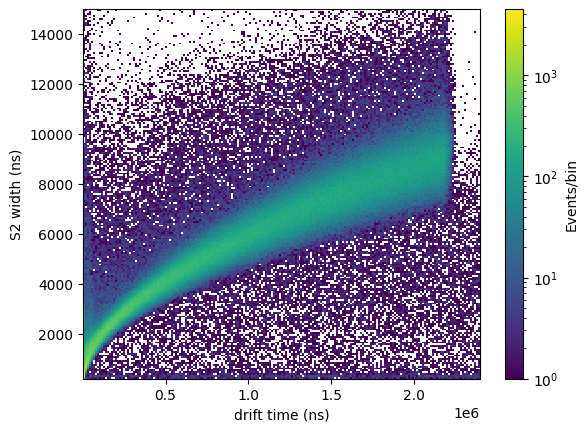

In [6]:
bin_edges = (np.linspace(2000, 2400000, 200), np.linspace(200, 15000, 200) )
axis_names = ('drift time (ns)','S2 width (ns)')
Kr_fit = Fit2d.Fit2dHisto()
Kr_fit.from_events(ev0, bin_edges, axis_names, plot=True)

In [31]:
start_values = dict(amp = 1, muX = 1e4, a = 7e3, muY = 389, b=6, theta=0.001 )
error_values = dict(amp = 1, muX = 1e4, a = 7e3, muY = 389, b=6, theta=0.001 )
limit_values = dict(amp = (None, None), muX = (None, None), a = (None, None), muY = (None, None), b=(None, None), theta=(None, None) )
fixed_values = dict(amp = False, muX = False, a = False, muY = False, b=False, theta=False )

Kr_fit.fit(Fit2d.two_d_gaussian, start_values, error_values, limit_values = limit_values,
           fixed_values=fixed_values, fit_type='Chi2' )

┌─────────────────────────────────────────────────────────────────────────┐
│                                Migrad                                   │
├──────────────────────────────────┬──────────────────────────────────────┤
│ FCN = 3.091e+05                  │              Nfcn = 992              │
│ EDM = 282 (Goal: 0.0002)         │            time = 3.4 sec            │
├──────────────────────────────────┼──────────────────────────────────────┤
│         INVALID Minimum          │        No Parameters at limit        │
├──────────────────────────────────┼──────────────────────────────────────┤
│ Below EDM threshold (goal x 10)  │           ABOVE call limit           │
├───────────────┬──────────────────┼───────────┬─────────────┬────────────┤
│  Covariance   │     Hesse ok     │APPROXIMATE│  Pos. def.  │ Not forced │
└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
┌───┬───────┬───────────┬───────────┬────────────┬────────────┬─────────┬─────────┬───────┐
│   │ Name  │   Value   │ Hesse Err │ Minos Err- │ Minos Err+ │ Limit-  │ Limit+  │ Fixed │
├───┼───────┼───────────┼───────────┼────────────┼────────────┼─────────┼─────────┼───────┤
│ 0 │ amp   │   105.4   │    0.8    │            │            │         │         │       │
│ 1 │ muX   │  513.5e3  │   1.9e3   │            │            │         │         │       │
│ 2 │ a     │  649.2e3  │   2.4e3   │            │            │         │         │       │
│ 3 │ muY   │  3.854e3  │  0.007e3  │            │            │         │         │       │
│ 4 │ b     │   241.0   │    0.6    │            │            │         │         │       │
│ 5 │ theta │ -256.6e-3 │  0.4e-3   │            │            │         │         │       │
└───┴───────┴───────────┴───────────┴────────────┴────────────┴─────────┴─────────┴───────┘
┌───────┬─────────────────────────────────────────────────────────────┐
│       │       amp       muX         a       muY         b     theta │
├───────┼─────────────────────────────────────────────────────────────┤
│   amp │      0.58      -897 -1.14e+03     -3.79    -0.329 -0.000159 │
│   muX │      -897  3.46e+06  4.41e+06  1.35e+04       380     0.638 │
│     a │ -1.14e+03  4.41e+06  5.62e+06  1.72e+04       485     0.814 │
│   muY │     -3.79  1.35e+04  1.72e+04        54      1.76   0.00241 │
│     b │    -0.329       380       485      1.76     0.388  7.37e-05 │
│ theta │ -0.000159     0.638     0.814   0.00241  7.37e-05  1.41e-07 │
└───────┴─────────────────────────────────────────────────────────────┘

In [32]:
def diffusion_constant_2d(events):
    
    print(f'Histogram contains {mh.n:.0f} events')
    
    #prepare_fits(self):
    z = mh.histogram.T
    # Get the edges and the centers  edges for plotting centers for fits
    x_edges = mh.bin_edges[0]
    y_edges = mh.bin_edges[1]
    x = mh.bin_centers()[0]
    y = mh.bin_centers()[1]
    # Create meshgrid
    x_mesh, y_mesh = np.meshgrid(x, y)
    x_mesh_ravel = x_mesh.ravel()
    y_mesh_ravel = y_mesh.ravel()
    z_ravel = z.ravel()
    # Assume symetric uncertainties. (only needed for chi2 fit)
    #z_err = yerror(z_ravel)

In [33]:
diffusion_constant_2d(ev0)

Histogram contains 400216 events


In [7]:
vd, vd_err, cathodedt, gatedt, s2shift = ddu.drift_velocity_kr(ev1,'Kr83m', binning=2000,w=4)

In [27]:
data_model = sps.multivariate_normal(mean=[0, 0], cov=[[2, 1], [1, 1]])
ref_model = data_model
print(type(data_model))
# Draw samples:
n_data_sample = 100
data_sample = data_model.rvs(n_data_sample, random_state=40)
reference_sample = ref_model.rvs(n_data_sample*100, random_state=41)

# Bin Data & Reference
bin_edges = [np.linspace(-5, 5, 6), np.linspace(-5, 5, 11)]
x, y = np.meshgrid((bin_edges[0][:-1] + bin_edges[0][1:]) / 2,
                   (bin_edges[1][:-1] + bin_edges[1][1:]) / 2)
bin_centers = np.stack((x, y), axis=2)
n_expectations = n_data_sample

pdf = ref_model.pdf(bin_centers).T
pdf /= np.sum(pdf)
expectations = pdf * n_expectations
print(type(pdf))

NameError: name 'sps' is not defined

In [93]:
def diffusion_model(t, D, vd, tGate):
    sigma_to_r50p = stats.norm.ppf(0.75) - stats.norm.ppf(0.25)
    return sigma_to_r50p * np.sqrt(2 * D * (t-tGate) / vd**2)
def diffusion_constant_gof(events, run_id, fit_range=(50000,2000000), vd = 600, plot = False, name = None):
    
    drift_time = np.array(events['drift_time']) # drift time in us
    s2_width = np.array(events['s2_a_range_50p_area'])
    
    # s2_width_50 vs drift_time
    t = np.linspace(0, 2400000, 200)
    
    ph = Histdd(drift_time, s2_width,bins=(t, np.linspace(100, 15e3, 200)))
    perc50 = np.array(ph.percentile(percentile=50, axis=1))
    D_guess = 45 * units.cm**2 / units.s 
    tGate_guess = 5 * units.us
    vd = vd * units.mm / units.us
    guess = np.array([D_guess, vd, tGate_guess])
    ys_m = diffusion_model(t, *guess)
    ll = np.where(t>fit_range[0])[0][0]
    hh = np.where(t>fit_range[1])[0][0]
    diffusion = lambda x, D, tGate: diffusion_model(x, D, vd, tGate)
    
    popt, pcov = curve_fit(diffusion, t[ll:hh], perc50[ll:hh], p0=(D_guess,tGate_guess))
    perr = np.sqrt(np.diag(pcov))
    
    #ys_u = diffusion(t, *popt) + 1000
    ys_m = diffusion(t, *popt)
    #ys_d = diffusion(t, *popt) - 1000
    
    diff_const = popt[0]/(units.cm**2 / units.s)
    diff_const_err = perr[0]/(units.cm**2 / units.s)
    
    if plot:
        plt.figure(figsize=(8,4.5))
        ph.plot(log_scale=True, cblabel='events')
        plt.xlabel("drift time (us)", ha='right', x=1,fontsize=12)
        plt.ylabel("S2 width 50% (ns)", ha='right', y=1,fontsize=12)
        plt.title(f'{run_id}',fontsize=14)
        plt.plot(t[:len(perc50)], perc50, color='b',linestyle='--', label='50% percentile')
        plt.axvspan(*fit_range, alpha=0.1, color='blue', label='fit region')
        plt.plot(t, ys_m, label=f'$D = {diff_const:.2f} \pm {diff_const_err:.2f}$ cm$^2$/s',color='r')
        #plt.plot(t, diffusion_model(t, *guess), label='guess',color='m')
        plt.legend(fontsize=14)
        if name is not None: plt.savefig(name+'_diffusion_constant.png',dpi=600)
        print(f'Diffusion constant = {diff_const:.2f} +/- {diff_const_err:.2f} cm2/s, tGate = {popt[1]:.2f} ns')
    
    data = np.column_stack((drift_time,drift_time))
    
    n_data_sample = 5
    data_model = sps.multivariate_normal(mean=[0, 0], cov=[[2, 1], [1, 1]])
    #ref_model = data_model
    
    data_sample = data_model.rvs(n_data_sample, random_state=40)
    reference_sample = ref_model.rvs(n_data_sample*100, random_state=41)
    n_expectations = n_data_sample
    print(type(ref_model))
    # define eqpb parameters
    order = [0, 1]  # [0, 1] means that first dimension 0 is binned, then dimension 1
    n_partitions = [5, 6]  # 5 partitions in dim. 0 and 6 partitions in dim. 1
    
    gof_object = ge.BinnedPoissonChi2GOF.bin_equiprobable(data_sample = data[:n_data_sample],
                                                          reference_sample = reference_sample,
                                                          nevents_expected = n_expectations,
                                                          n_partitions = n_partitions,
                                                          order = order,
                                                          plot = True)
    
    #return diff_const, diff_const_err, popt, perr

/tmp/jobs/23164757/ipykernel_2176/1596627786.py:3: RuntimeWarning: invalid value encountered in sqrt
  return sigma_to_r50p * np.sqrt(2 * D * (t-tGate) / vd**2)


Diffusion constant = 47.01 +/- 0.13 cm2/s, tGate = 19702.00 ns
<class 'scipy.stats._multivariate.multivariate_normal_frozen'>


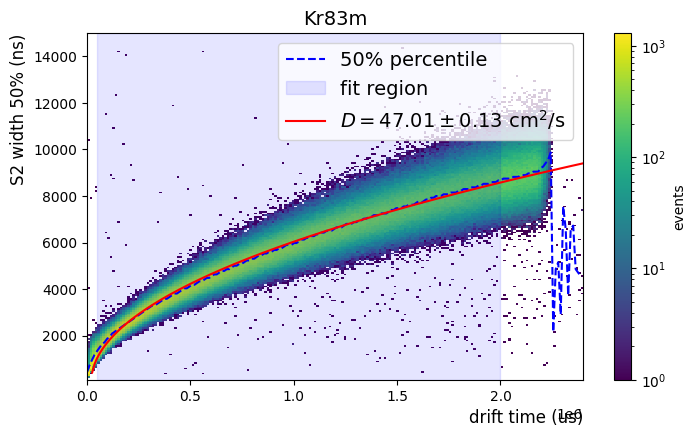

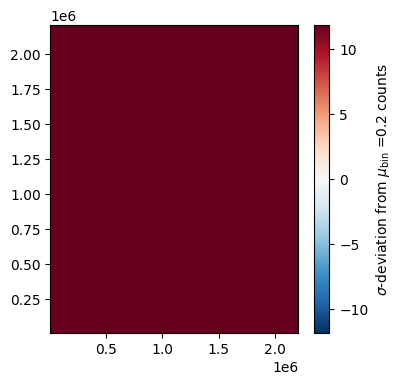

In [94]:
diffusion_constant_gof(ev1,'Kr83m',vd=vd,plot=1)

In [9]:
def diffusion_analysis_kr(ev, title = 'Kr83m', fit_range = (50,2000), far = True, plot = False,
                          sr0 = False, name = None):
    #if(plot): ddu.plot_area_width_aft(ev, title)
    
    ######### Kr selection #########
    if sr0:
        KrSelection = st.get_single_plugin('030000', 'cut_Kr_SingleS1S2')
        mask = KrSelection.cut_by(ev)
    else: mask = ddu.mask_KrSingleS1(ev)
    
    ######### Perpendicular Wires selection #########
    #FarWires = st.get_single_plugin('030000', 'cut_far_wires')
    #NearWires = st.get_single_plugin('030000', 'cut_near_wires')
    #maskFW = FarWires.cut_by(ev)
    #maskNW = NearWires.cut_by(ev)
    maskFW, maskNW = wcu.mask_S2Width_vs_pos_kr(ev)
    if far: evD = ev[mask & maskFW]
    else: evD = ev[mask & maskNW]
    #maskFV = ev['cut_fiducial_volume']
    #maskFV = ddu.mask_FV(ev)
    #if(plot):
        #ddu.plot_s2width_dt_kr(evD, title,width='90p',wlim = (0,30000),name=name)
        #ddu.plot_s2width_dt_kr(evD, title,width='90p',tlim = (0,200),wlim = (0,7000), name=name)
    #    ddu.plot_area_width_aft_kr(evD, title)
    #    wcu.plot_r2z_xy(evD,title)
    vd, vd_err, cathodedt, gatedt, s2shift = ddu.drift_velocity_kr(evD,title,name=name,
                                                                   binning=2000,w=4,plot=plot)
    d, d_err, par, par_err = ddu.diffusion_constant_kr(evD,title,fit_range=fit_range,vd=vd,
                                                       plot=plot,name=name)
    #return vd, vd_err, d, d_err, cathodedt, gatedt, s2shift, par, par_err
    par = (d* units.cm**2 / units.s,vd* units.mm / units.us,gatedt*units.us)
    return par

/home/valerioda/.local/lib/python3.8/site-packages/pandas-1.4.2-py3.8-linux-x86_64.egg/pandas/core/arraylike.py:397: RuntimeWarning: invalid value encountered in sqrt
  result = getattr(ufunc, method)(*inputs, **kwargs)


Drift velocity = 0.678 +/- 0.003 mm/us
Diffusion constant = 47.01 +/- 0.13 cm2/s, tGate = 19.70 us


/home/valerioda/xenon-notes/fast_response_analysis/drift_diffusion_utility.py:392: RuntimeWarning: invalid value encountered in sqrt
  return sigma_to_r50p * np.sqrt(2 * D * (t-tGate) / vd**2)


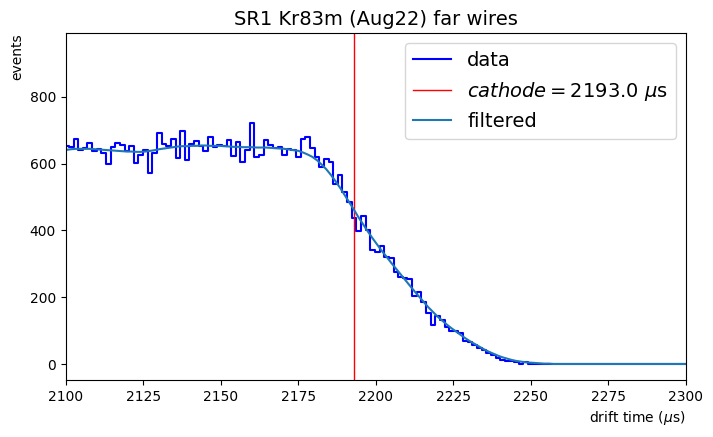

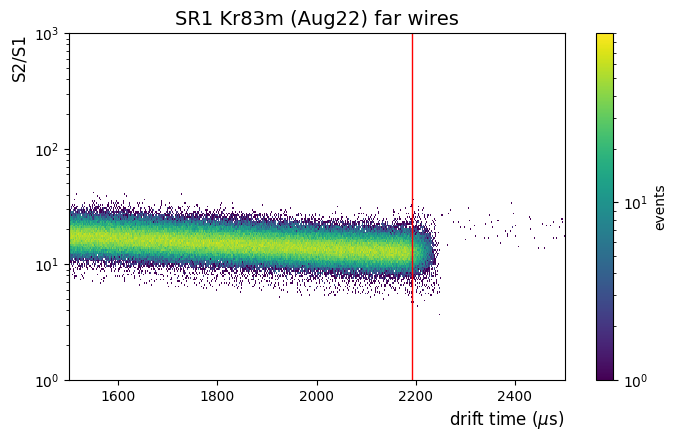

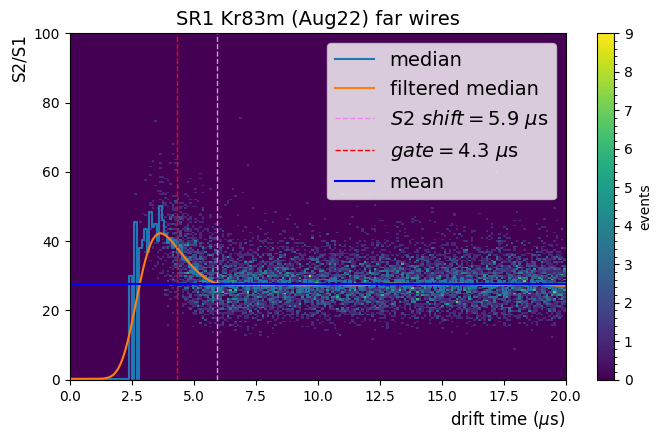

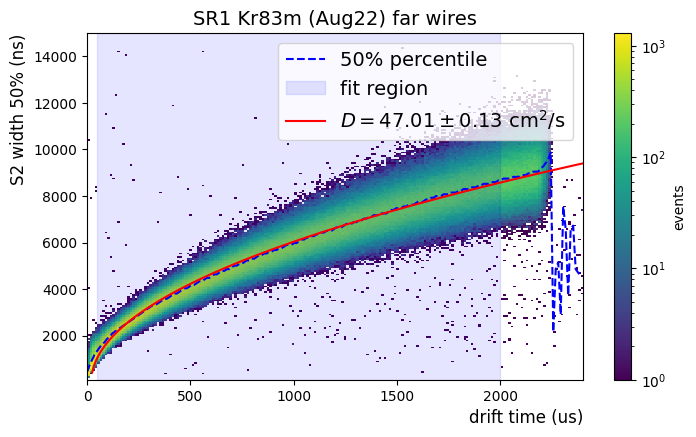

In [18]:
par=diffusion_analysis_kr(evKr1, title = 'SR1 Kr83m (Aug22) far wires',plot=1)#,name='sr1_kr83m_aug22_fw')

/home/valerioda/.local/lib/python3.8/site-packages/pandas-1.4.2-py3.8-linux-x86_64.egg/pandas/core/arraylike.py:397: RuntimeWarning: invalid value encountered in sqrt
  result = getattr(ufunc, method)(*inputs, **kwargs)


Drift velocity = 0.677 +/- 0.003 mm/us


/home/valerioda/xenon-notes/fast_response_analysis/drift_diffusion_utility.py:392: RuntimeWarning: invalid value encountered in sqrt
  


Diffusion constant = 52.09 +/- 0.18 cm2/s, tGate = 23.34 us


(5.2090497182188053e-08, 6.772623644929514e-05, 5628.140703517588)

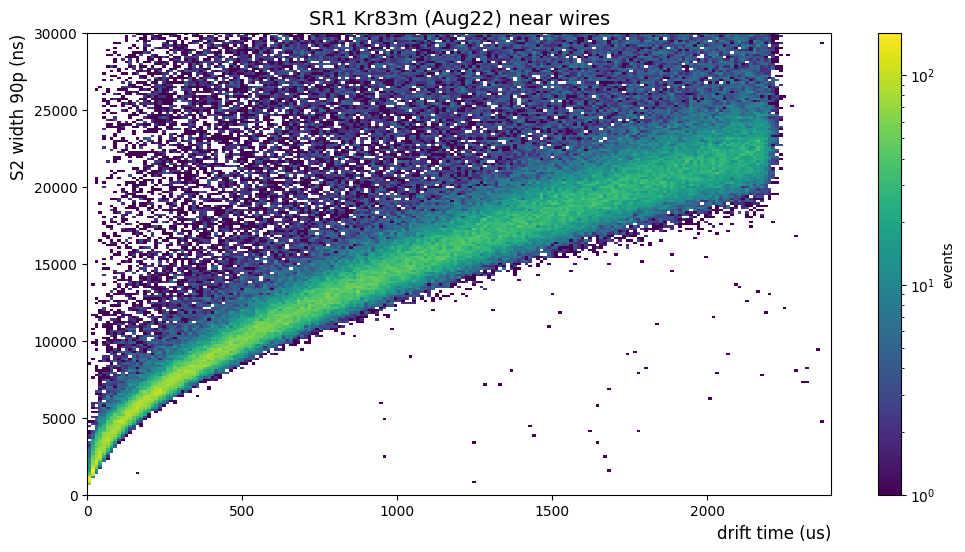

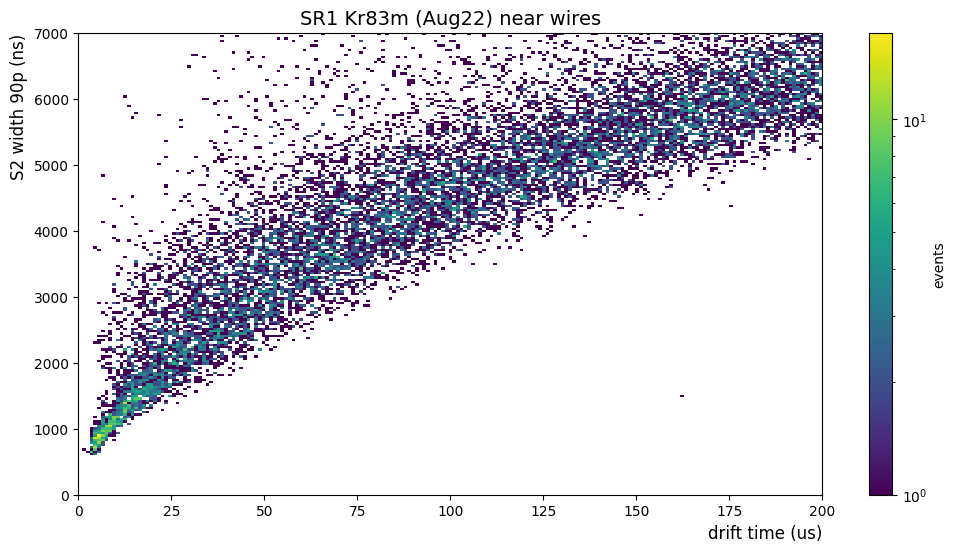

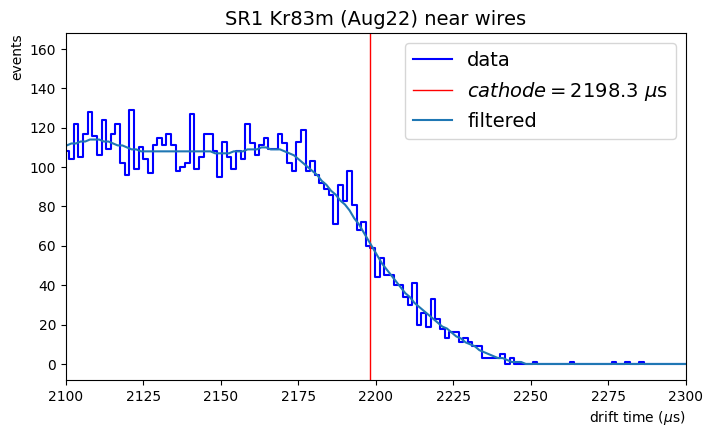

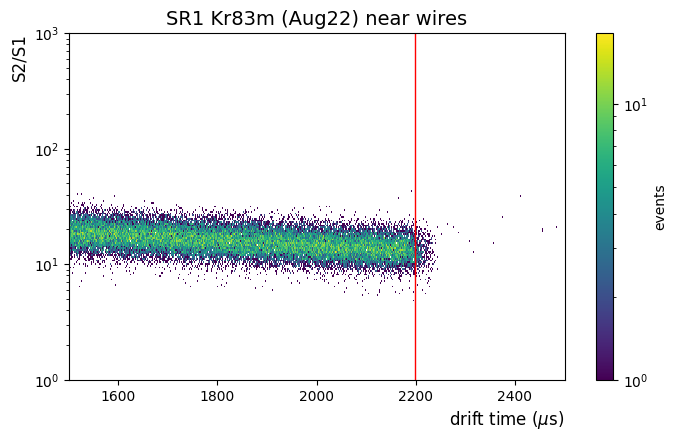

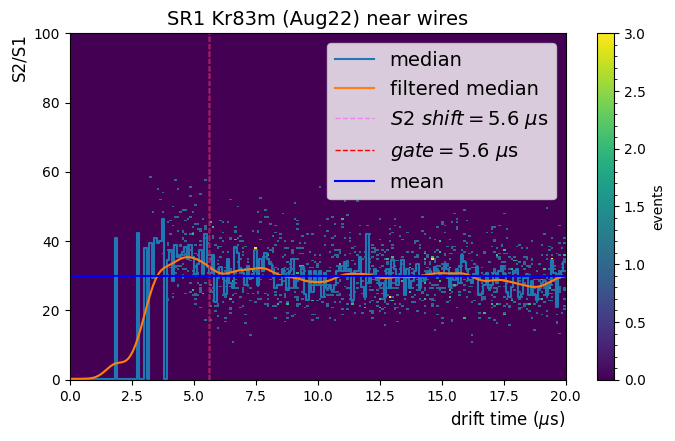

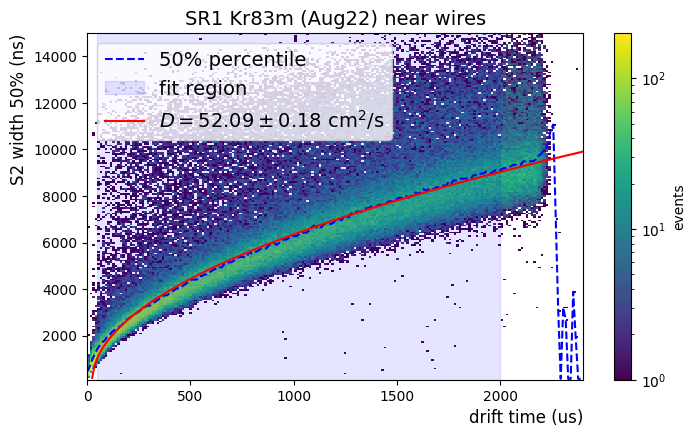

In [93]:
diffusion_analysis_kr(evKr0, title = 'SR1 Kr83m (Aug22) near wires',plot=1,far=0)

/home/valerioda/.local/lib/python3.8/site-packages/pandas-1.4.2-py3.8-linux-x86_64.egg/pandas/core/arraylike.py:397: RuntimeWarning: invalid value encountered in sqrt
  result = getattr(ufunc, method)(*inputs, **kwargs)


Drift velocity = 0.677 +/- 0.003 mm/us


/home/valerioda/xenon-notes/fast_response_analysis/drift_diffusion_utility.py:392: RuntimeWarning: invalid value encountered in sqrt
  


Diffusion constant = 46.33 +/- 0.13 cm2/s, tGate = 18.34 us


(4.632599242930811e-08, 6.769830922713626e-05, 4723.618090452262)

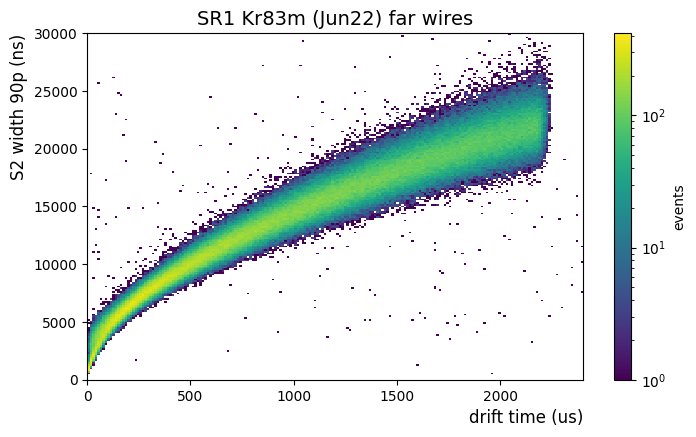

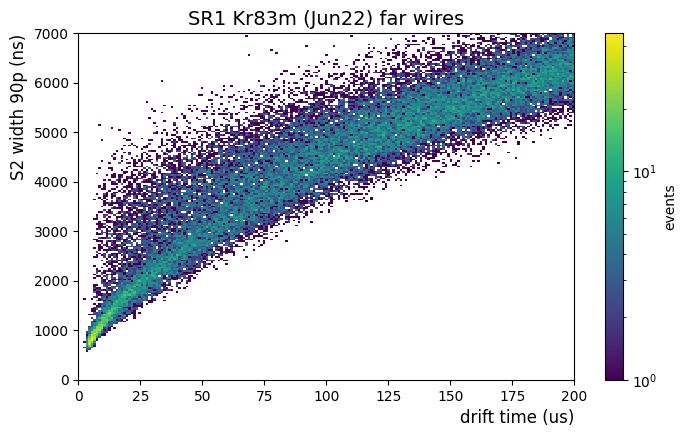

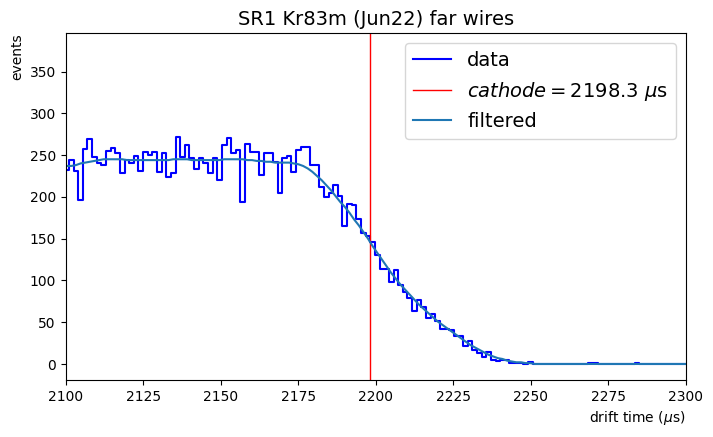

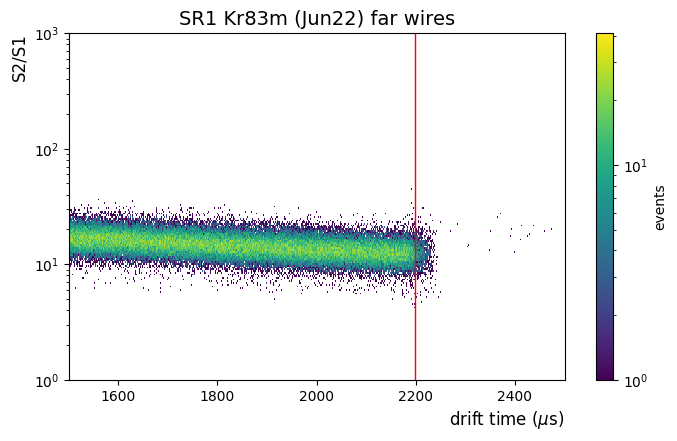

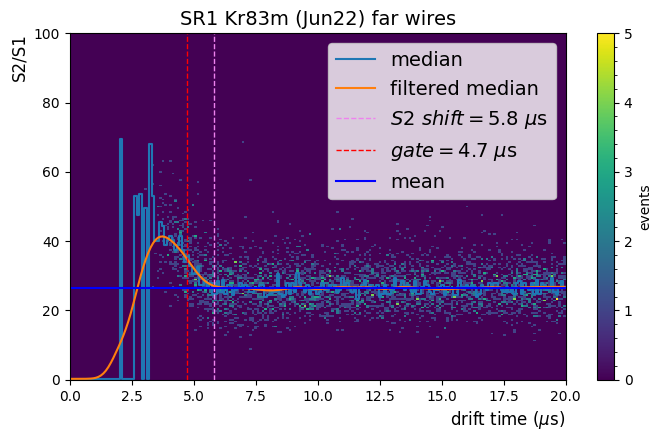

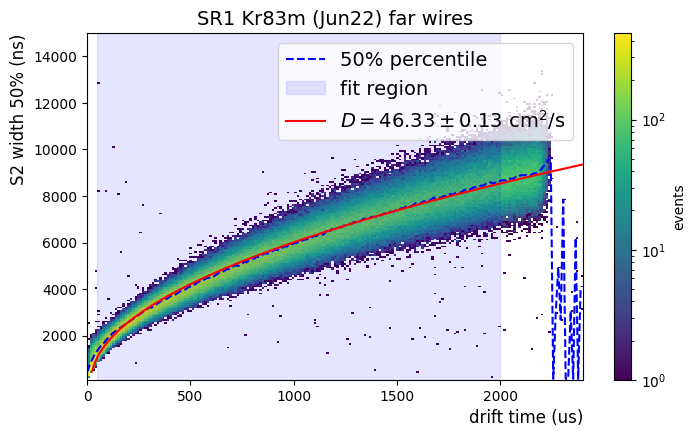

In [102]:
diffusion_analysis_kr(evKr1, title = 'SR1 Kr83m (Jun22) far wires',plot=1,name='sr1_kr83m_jun22_fw')

/home/valerioda/.local/lib/python3.8/site-packages/pandas-1.4.2-py3.8-linux-x86_64.egg/pandas/core/arraylike.py:397: RuntimeWarning: invalid value encountered in sqrt
  result = getattr(ufunc, method)(*inputs, **kwargs)


Drift velocity = 0.685 +/- 0.003 mm/us


/home/valerioda/xenon-notes/fast_response_analysis/drift_diffusion_utility.py:392: RuntimeWarning: invalid value encountered in sqrt
  


Diffusion constant = 52.94 +/- 0.18 cm2/s, tGate = 23.68 us


(5.2935465290124325e-08, 6.850325293664556e-05, 17286.432160804023)

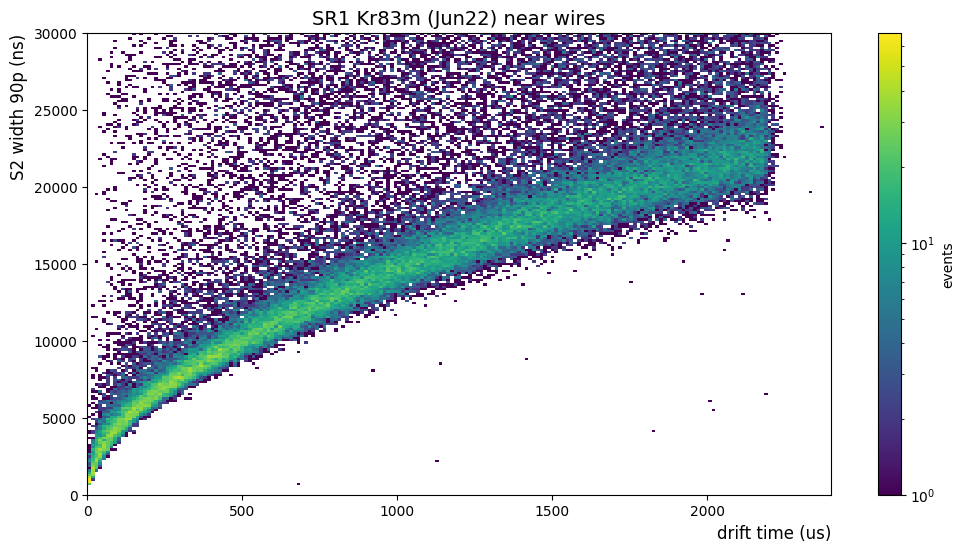

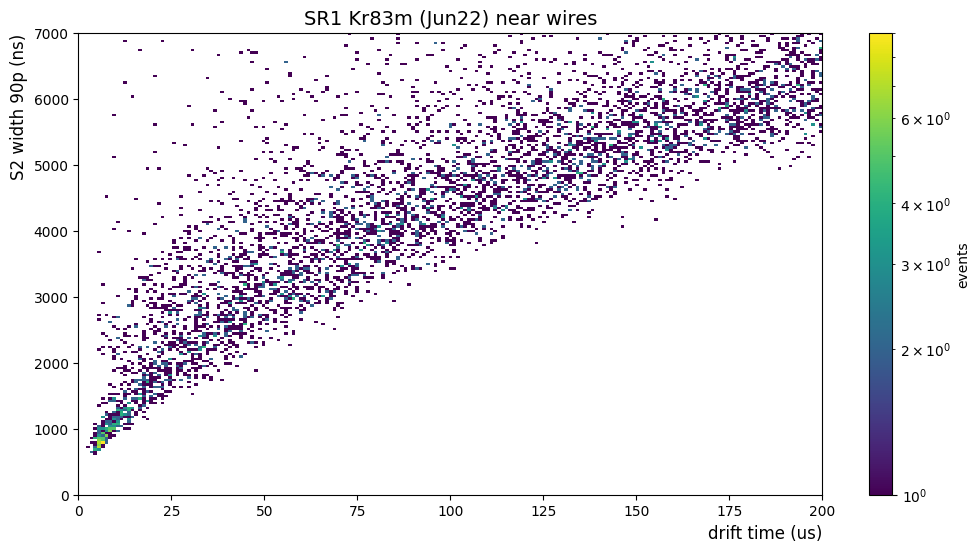

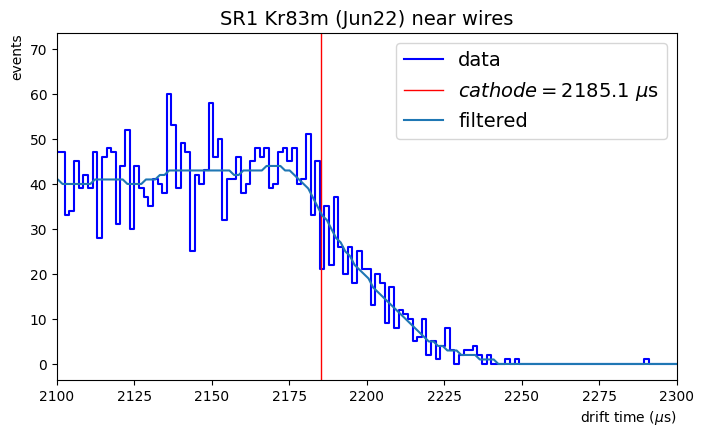

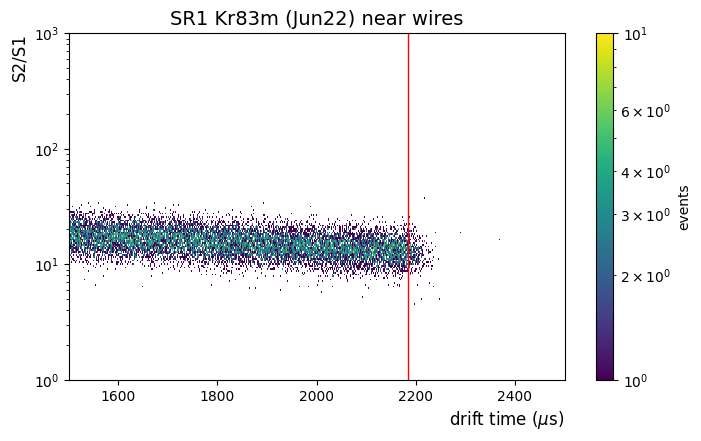

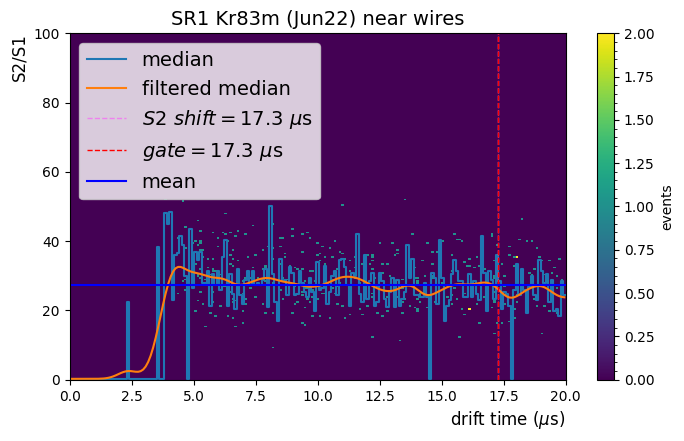

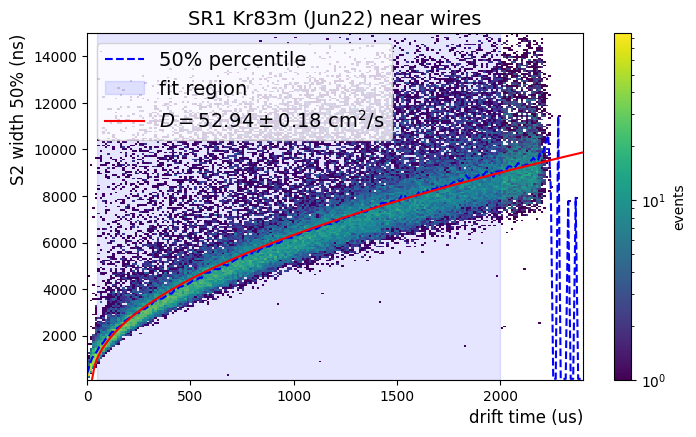

In [95]:
diffusion_analysis_kr(evKr1, title = 'SR1 Kr83m (Jun22) near wires',plot=1,far=0)

In [77]:
evKr_sr0 = pd.read_pickle(f'{ddir}/SR0_v8_Kr83m_021479_021521_EventInfoDouble.pkl') 

/home/valerioda/.local/lib/python3.8/site-packages/pandas-1.4.2-py3.8-linux-x86_64.egg/pandas/core/arraylike.py:397: RuntimeWarning: invalid value encountered in sqrt
  result = getattr(ufunc, method)(*inputs, **kwargs)


Drift velocity = 0.674 +/- 0.003 mm/us


/home/valerioda/xenon-notes/fast_response_analysis/drift_diffusion_utility.py:392: RuntimeWarning: invalid value encountered in sqrt
  


Diffusion constant = 45.67 +/- 0.13 cm2/s, tGate = 15.15 us


(4.5671048386953186e-08, 6.74422866525675e-05, 4623.115577889448)

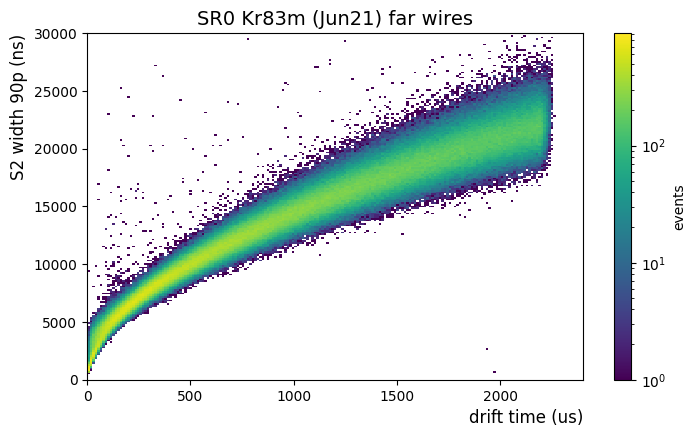

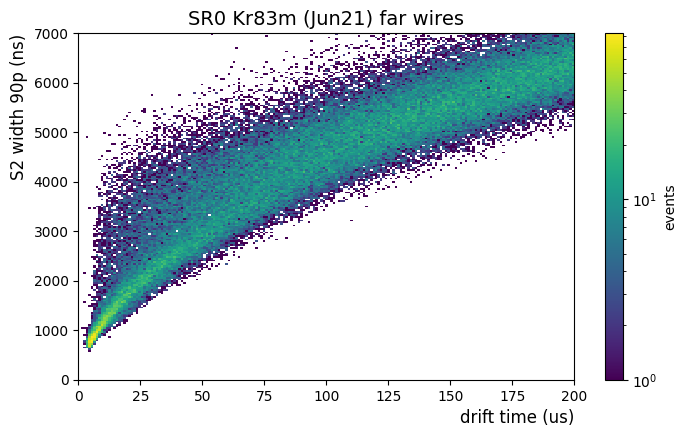

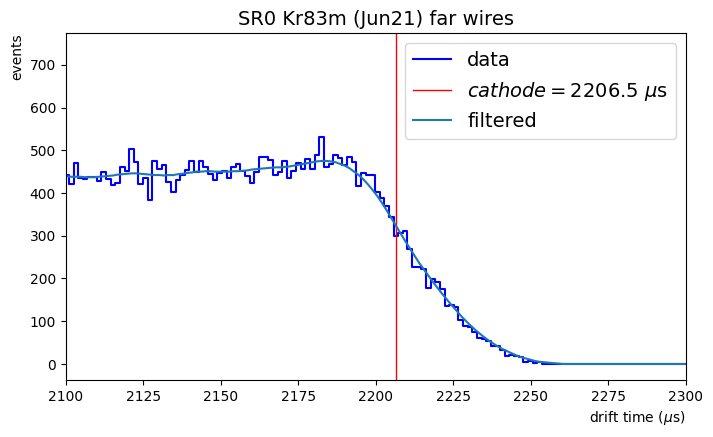

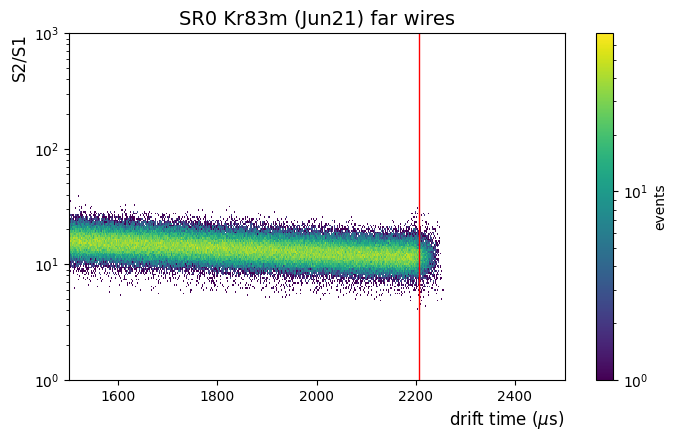

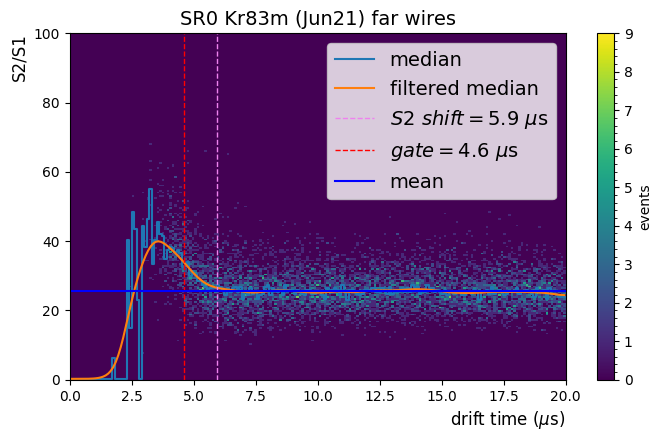

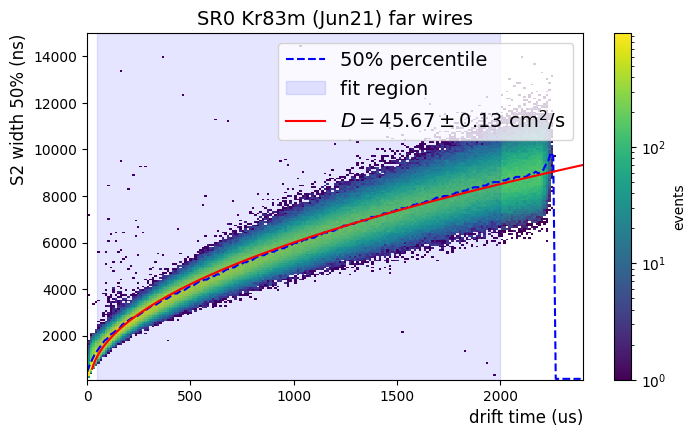

In [103]:
diffusion_analysis_kr(evKr_sr0,title='SR0 Kr83m (Jun21) far wires',plot=1,name='sr0_kr83m_jun21_fw',sr0=1)

/home/valerioda/.local/lib/python3.8/site-packages/pandas-1.4.2-py3.8-linux-x86_64.egg/pandas/core/arraylike.py:397: RuntimeWarning: invalid value encountered in sqrt
  result = getattr(ufunc, method)(*inputs, **kwargs)


Drift velocity = 0.676 +/- 0.003 mm/us


/home/valerioda/xenon-notes/fast_response_analysis/drift_diffusion_utility.py:392: RuntimeWarning: invalid value encountered in sqrt
  


Diffusion constant = 48.84 +/- 0.14 cm2/s, tGate = 16.60 us


(4.8844131837712365e-08, 6.761229750457772e-05, 4924.62311557789)

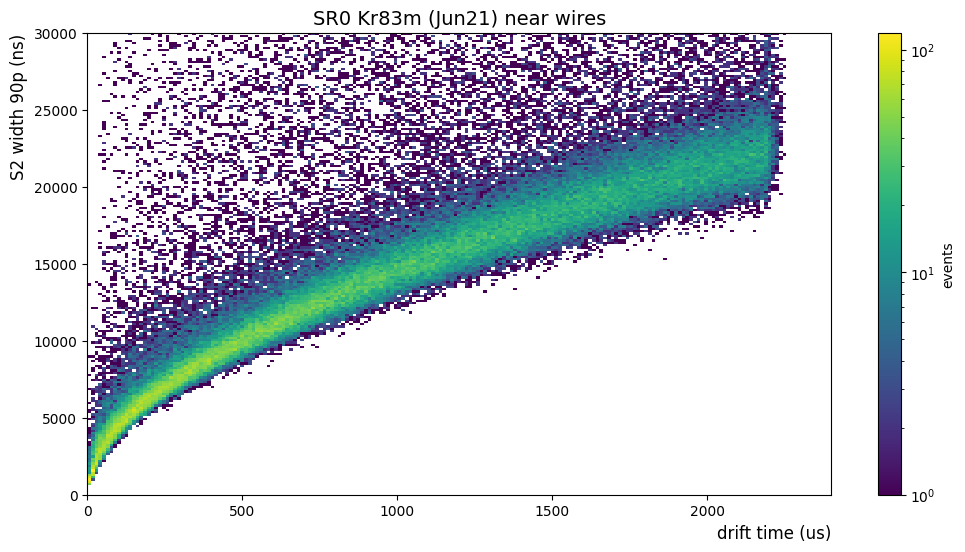

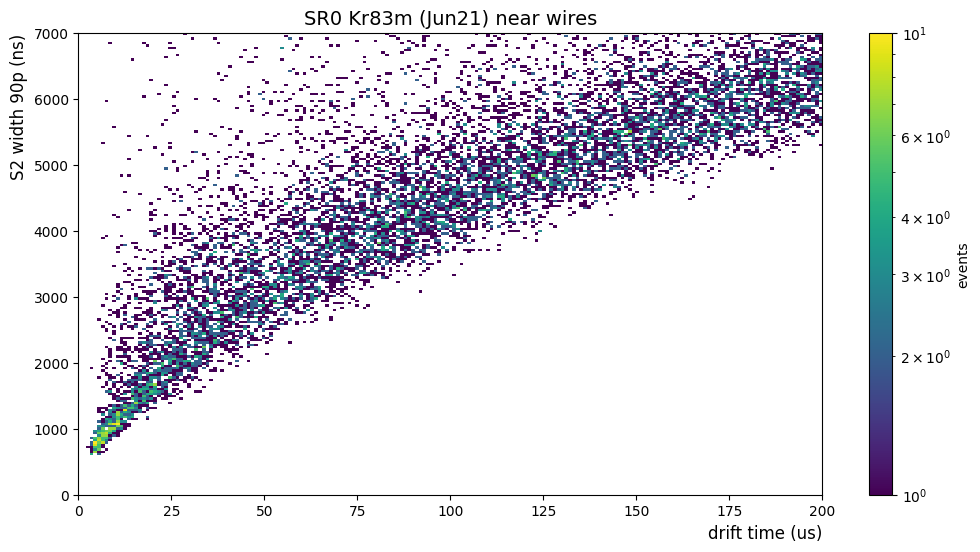

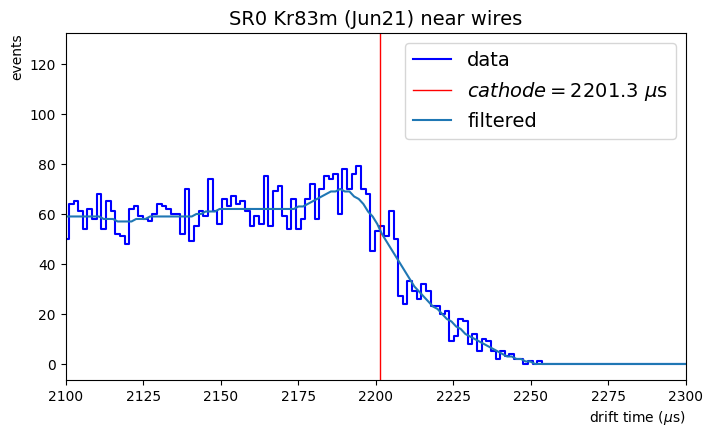

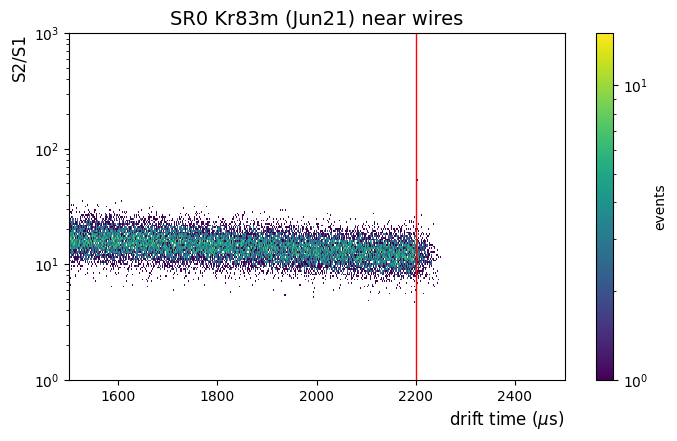

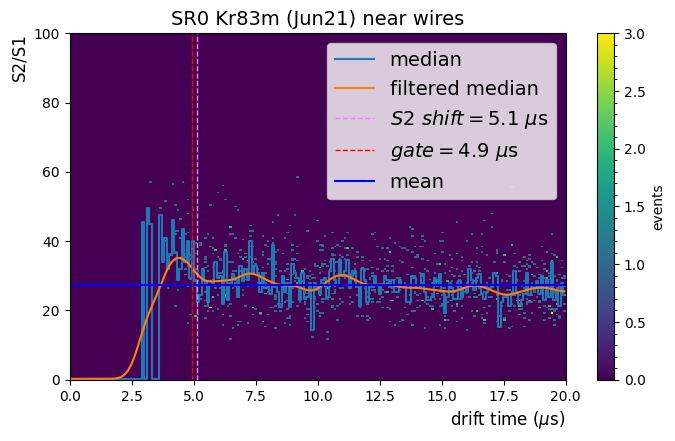

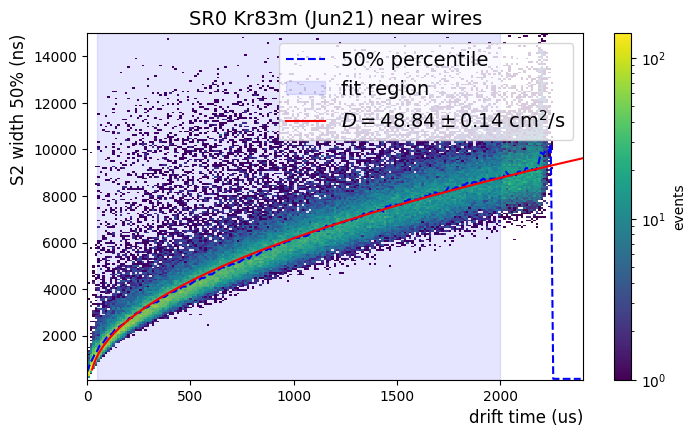

In [97]:
diffusion_analysis_kr(evKr_sr0,title='SR0 Kr83m (Jun21) near wires',plot=1,far=0,sr0=1)

# S2 Width Cut

In [20]:
# FAR FROM WIRES 1-99%
cut_far = (( 0.75785949 , 3.18263529 , 1.26349891 ),
          ( 4.74467848 , 1.34106577 , 1.99650474 , 1.02559667 ))
# NEAR WIRES 5-99%
cut_near = (( 0.7742574 , 2.92714807 , 1.22338626 ),
           ( 4.74467848 , 1.34106577 , 1.99650474 , 1.02559667 ))

In [21]:
vd = get_correction_from_cmt('024075',('electron_drift_velocity', 'ONLINE', True))
gd = get_correction_from_cmt('024075',('electron_drift_time_gate', 'ONLINE', True))
dc = get_correction_from_cmt('024075',('electron_diffusion_cte', 'ONLINE', True))
par = (dc,vd,gd)
print(par)

(4.566e-08, 6.77e-05, 2700.0)


In [132]:
def apply_cut(events, title = 'Kr-83m', near = True, name = None, sr0 = False):
    if sr0:
        KrSelection = st.get_single_plugin('030000', 'cut_Kr_SingleS1S2')
        mask = KrSelection.cut_by(events)
    else: mask = ddu.mask_KrSingleS1(events)
    maskFW, maskNW = wcu.mask_S2Width_vs_pos_kr(events)
    if near: ev = events[mask & maskNW]
    else: ev = events[mask & maskFW]
    cut_mask_kr = wcu.S2WidthCut(ev, title=title, mod_par=par, bins=400,name = name,
                             wrange=(0,6),arange=(2.6,4.8), plot = 1, perc_plot=0,
                             ext_par=cut_far, near_wires=near, wire_model=near,kr=1 )
    acc_kr = wcu.get_acceptance_kr(ev, cut_mask_kr[1], title=title, alim=(0.8,1),name = name)

/home/valerioda/.local/lib/python3.8/site-packages/pandas-1.4.2-py3.8-linux-x86_64.egg/pandas/core/arraylike.py:397: RuntimeWarning: invalid value encountered in sqrt
  result = getattr(ufunc, method)(*inputs, **kwargs)


Lower and higher boundary provided externally
param_parabola_low: [0.00487747 0.09634786 0.19632401]
param_parabola_high: [ 0.12086553 -1.2295208   4.37596581]
Cut: total 1047037, survived 1005909 -> 96.07%


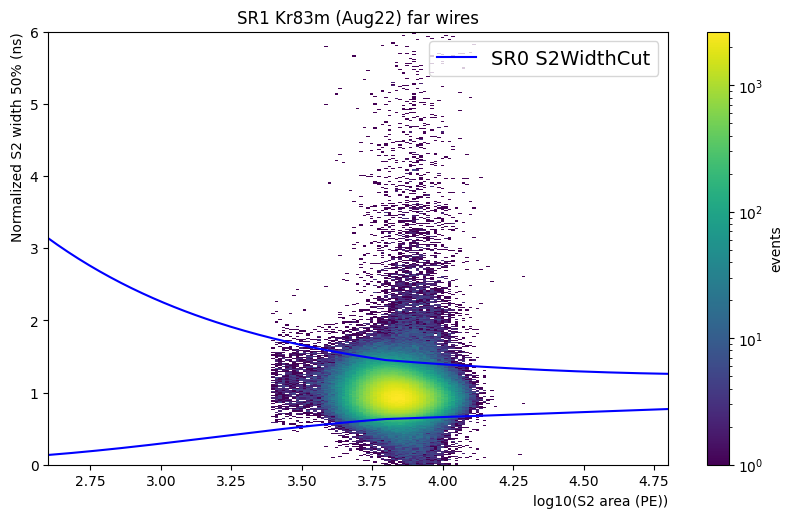

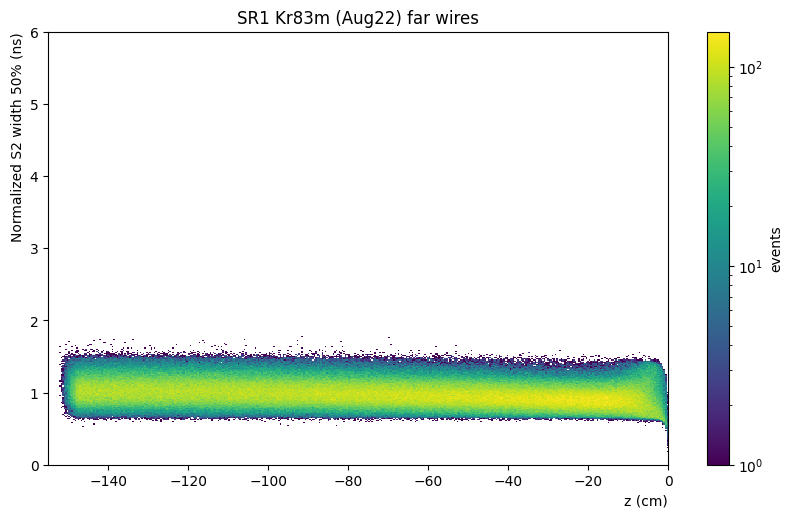

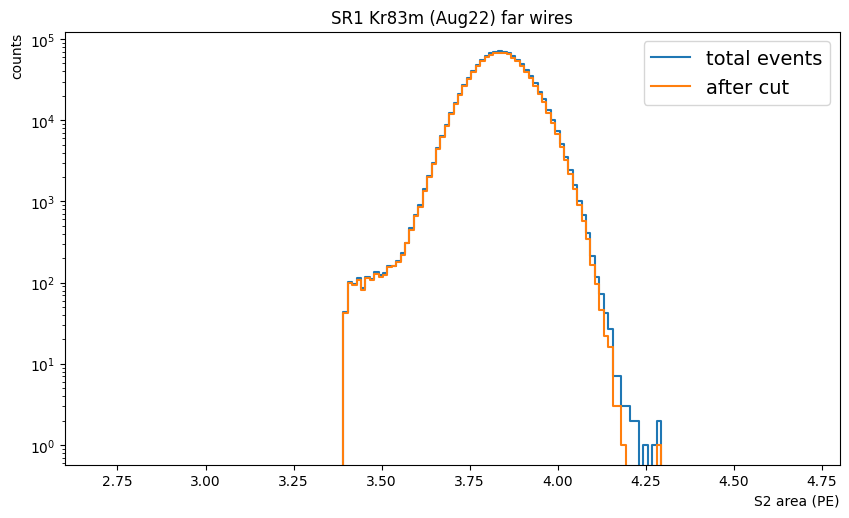

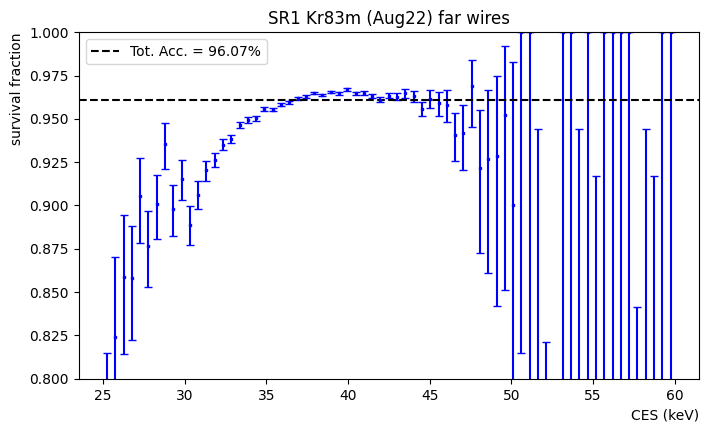

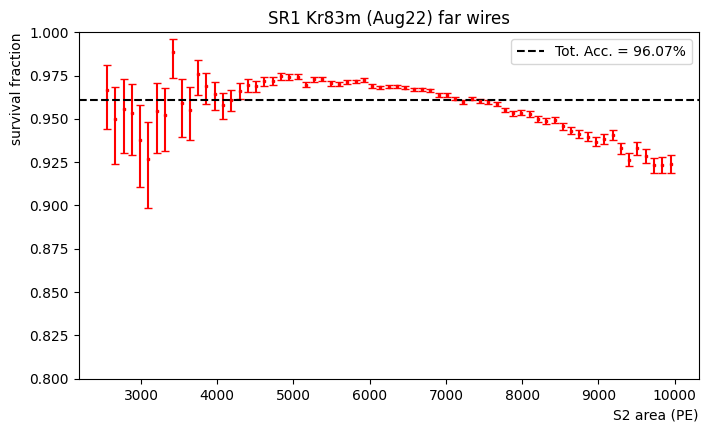

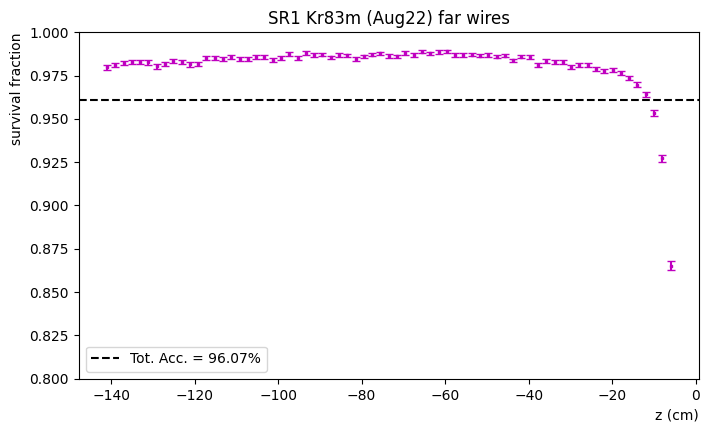

In [120]:
apply_cut(evKr0, title = 'SR1 Kr83m (Aug22) far wires', near = 0,name='sr1_kr83m_aug22_fw')

/home/valerioda/.local/lib/python3.8/site-packages/pandas-1.4.2-py3.8-linux-x86_64.egg/pandas/core/arraylike.py:397: RuntimeWarning: invalid value encountered in sqrt
  result = getattr(ufunc, method)(*inputs, **kwargs)


Lower and higher boundary provided externally
param_parabola_low: [0.00487747 0.09634786 0.19632401]
param_parabola_high: [ 0.12086553 -1.2295208   4.37596581]
Cut: total 169366, survived 165932 -> 97.97%


/home/valerioda/.local/lib/python3.8/site-packages/pandas-1.4.2-py3.8-linux-x86_64.egg/pandas/core/arraylike.py:397: RuntimeWarning: invalid value encountered in sqrt
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/valerioda/.local/lib/python3.8/site-packages/pandas-1.4.2-py3.8-linux-x86_64.egg/pandas/core/arraylike.py:397: RuntimeWarning: invalid value encountered in sqrt
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/valerioda/.local/lib/python3.8/site-packages/pandas-1.4.2-py3.8-linux-x86_64.egg/pandas/core/arraylike.py:397: RuntimeWarning: invalid value encountered in sqrt
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/valerioda/.local/lib/python3.8/site-packages/pandas-1.4.2-py3.8-linux-x86_64.egg/pandas/core/arraylike.py:397: RuntimeWarning: invalid value encountered in sqrt
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/valerioda/.local/lib/python3.8/site-packages/pandas-1.4.2-py3.8-linux-x86_64.egg/pandas/core/arraylike.py:397: Run

Cut wire modeled: total 169366, survived 163886 -> 96.76%


/home/valerioda/.local/lib/python3.8/site-packages/pandas-1.4.2-py3.8-linux-x86_64.egg/pandas/core/arraylike.py:397: RuntimeWarning: invalid value encountered in sqrt
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/valerioda/.local/lib/python3.8/site-packages/pandas-1.4.2-py3.8-linux-x86_64.egg/pandas/core/arraylike.py:397: RuntimeWarning: invalid value encountered in sqrt
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/valerioda/xenon-notes/fast_response_analysis/s2widthcut_utility.py:764: RuntimeWarning: invalid value encountered in long_scalars
  avg = k / n
/home/valerioda/xenon-notes/fast_response_analysis/s2widthcut_utility.py:764: RuntimeWarning: invalid value encountered in long_scalars
  avg = k / n
/home/valerioda/xenon-notes/fast_response_analysis/s2widthcut_utility.py:764: RuntimeWarning: invalid value encountered in long_scalars
  avg = k / n
/home/valerioda/xenon-notes/fast_response_analysis/s2widthcut_utility.py:764: RuntimeWarning: invalid value en

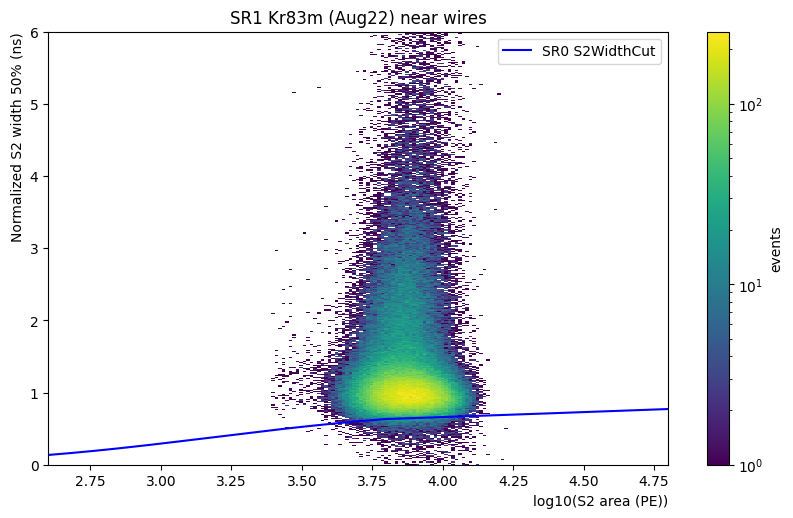

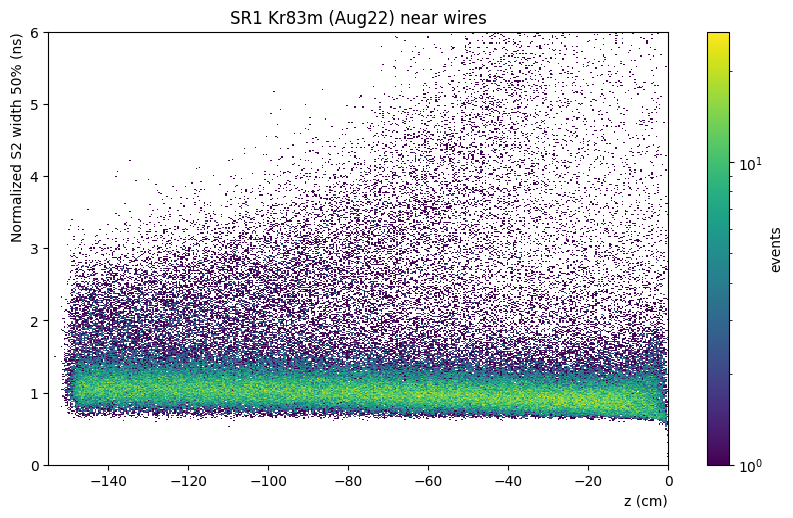

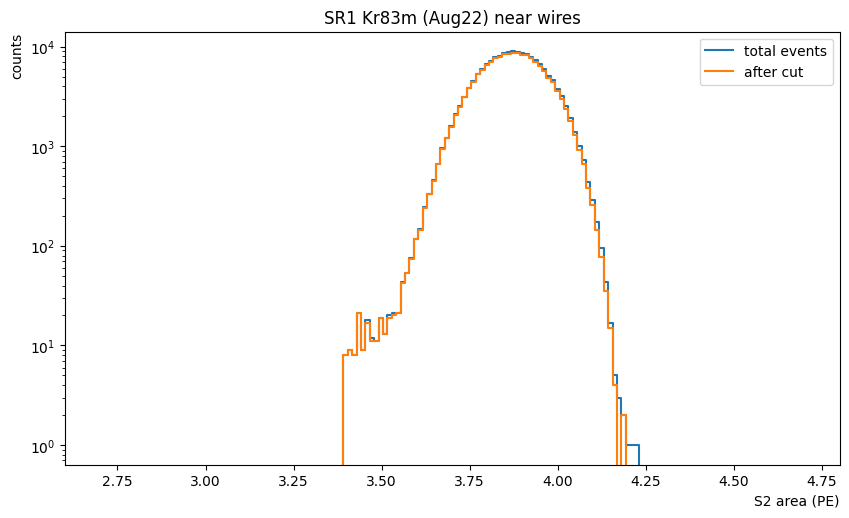

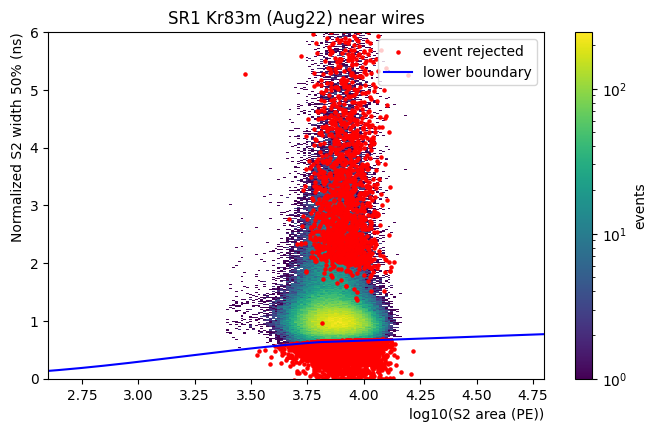

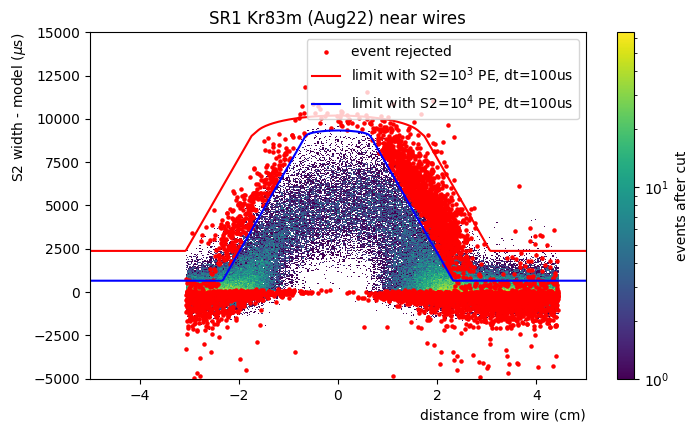

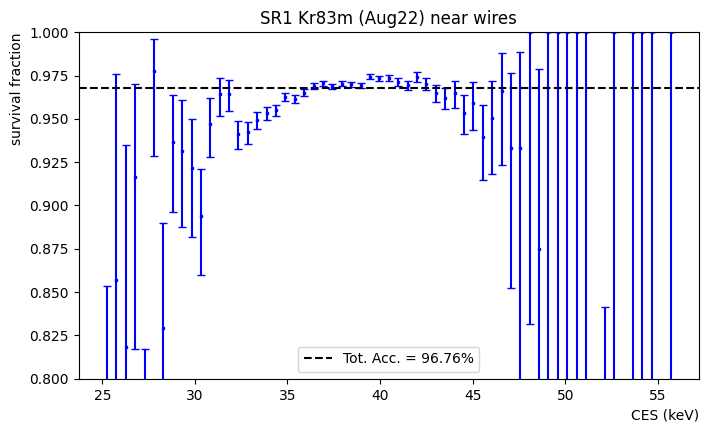

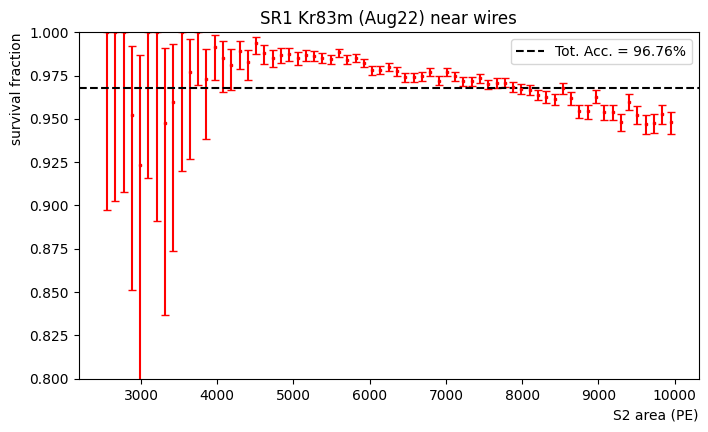

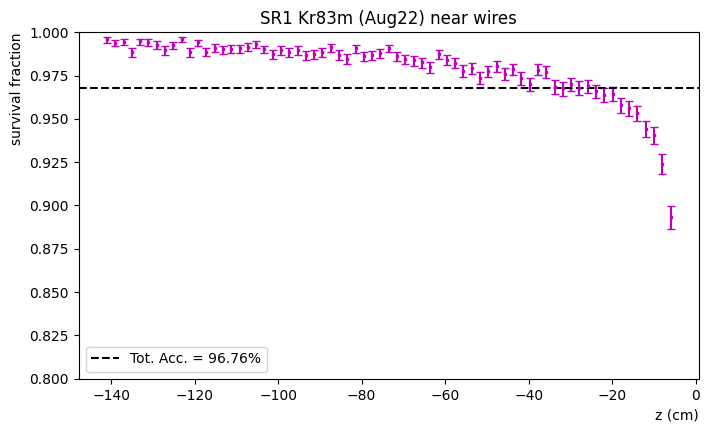

In [127]:
apply_cut(evKr0, title = 'SR1 Kr83m (Aug22) near wires', near = 1,name='sr1_kr83m_aug22_nw')

/home/valerioda/.local/lib/python3.8/site-packages/pandas-1.4.2-py3.8-linux-x86_64.egg/pandas/core/arraylike.py:397: RuntimeWarning: invalid value encountered in sqrt
  result = getattr(ufunc, method)(*inputs, **kwargs)


Lower and higher boundary provided externally
param_parabola_low: [0.00487747 0.09634786 0.19632401]
param_parabola_high: [ 0.12086553 -1.2295208   4.37596581]
Cut: total 400295, survived 384584 -> 96.08%


/home/valerioda/xenon-notes/fast_response_analysis/s2widthcut_utility.py:764: RuntimeWarning: invalid value encountered in long_scalars
  avg = k / n
/home/valerioda/xenon-notes/fast_response_analysis/s2widthcut_utility.py:764: RuntimeWarning: invalid value encountered in long_scalars
  avg = k / n
/home/valerioda/xenon-notes/fast_response_analysis/s2widthcut_utility.py:764: RuntimeWarning: invalid value encountered in long_scalars
  avg = k / n
/home/valerioda/xenon-notes/fast_response_analysis/s2widthcut_utility.py:764: RuntimeWarning: invalid value encountered in long_scalars
  avg = k / n
/home/valerioda/.local/lib/python3.8/site-packages/multihist-0.6.5-py3.8.egg/multihist.py:106: RuntimeWarning: invalid value encountered in true_divide
  getattr(self.histogram, opname)(other),


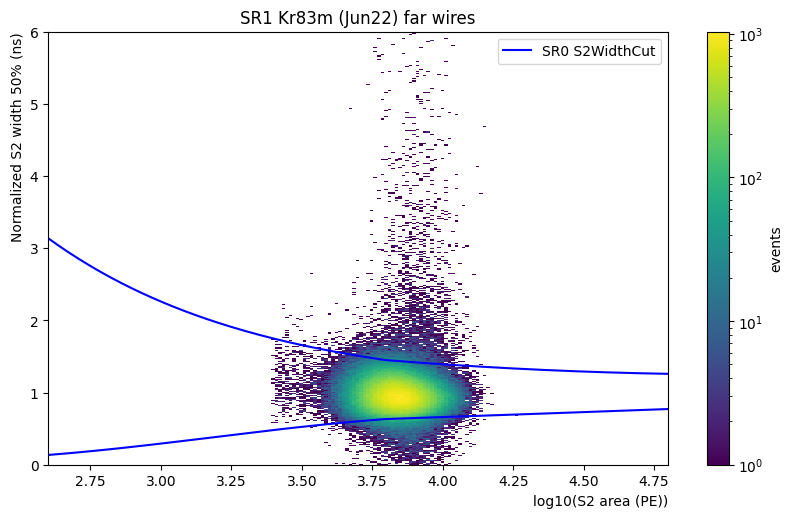

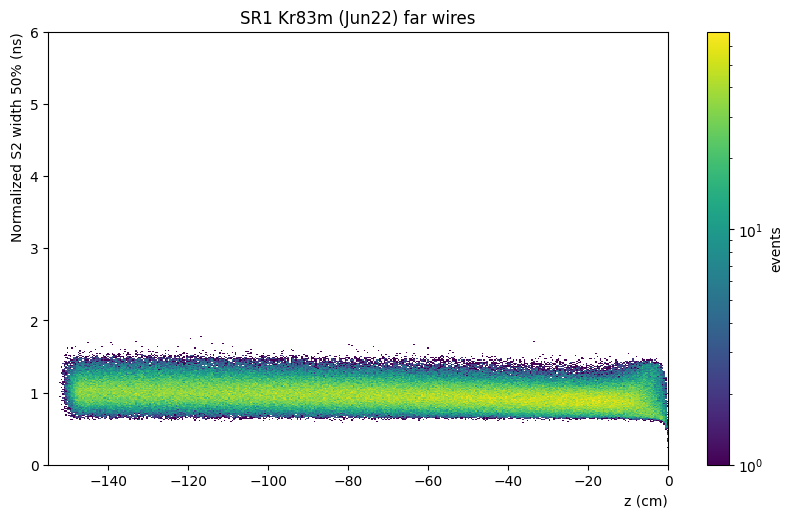

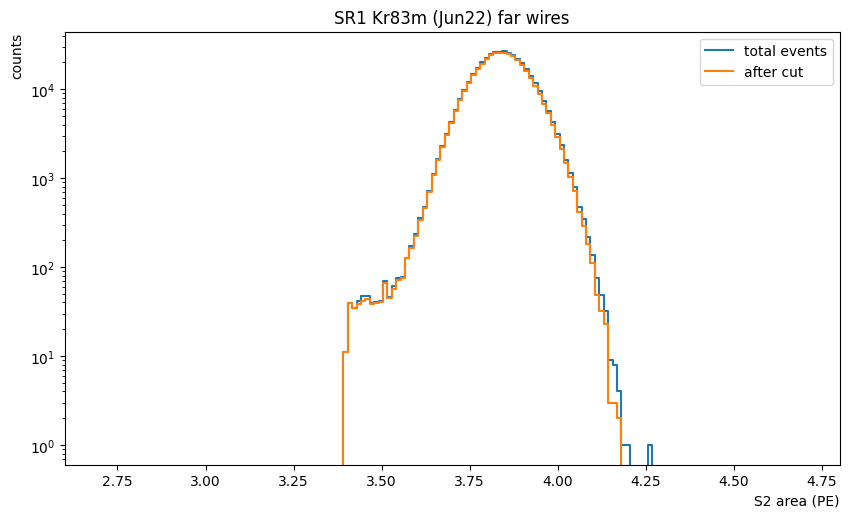

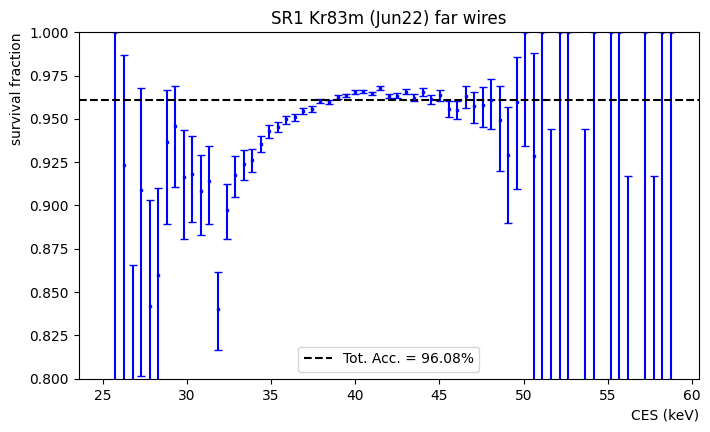

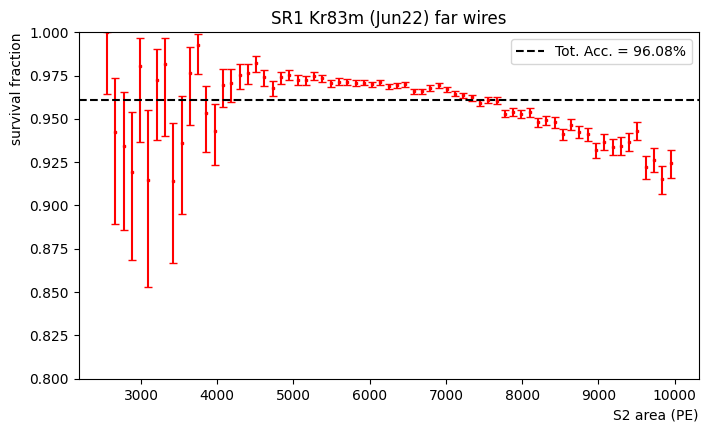

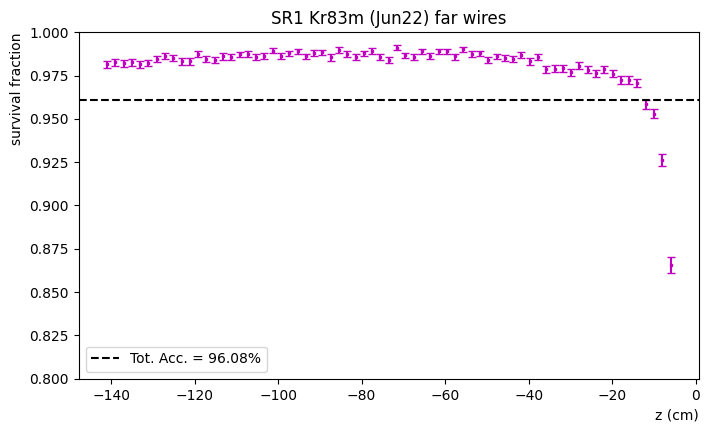

In [128]:
apply_cut(evKr1, title = 'SR1 Kr83m (Jun22) far wires', near = 0,name='sr1_kr83m_jun22_fw')

/home/valerioda/.local/lib/python3.8/site-packages/pandas-1.4.2-py3.8-linux-x86_64.egg/pandas/core/arraylike.py:397: RuntimeWarning: invalid value encountered in sqrt
  result = getattr(ufunc, method)(*inputs, **kwargs)


Lower and higher boundary provided externally
param_parabola_low: [0.00487747 0.09634786 0.19632401]
param_parabola_high: [ 0.12086553 -1.2295208   4.37596581]
Cut: total 64988, survived 63664 -> 97.96%


/home/valerioda/.local/lib/python3.8/site-packages/pandas-1.4.2-py3.8-linux-x86_64.egg/pandas/core/arraylike.py:397: RuntimeWarning: invalid value encountered in sqrt
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/valerioda/.local/lib/python3.8/site-packages/pandas-1.4.2-py3.8-linux-x86_64.egg/pandas/core/arraylike.py:397: RuntimeWarning: invalid value encountered in sqrt
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/valerioda/.local/lib/python3.8/site-packages/pandas-1.4.2-py3.8-linux-x86_64.egg/pandas/core/arraylike.py:397: RuntimeWarning: invalid value encountered in sqrt
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/valerioda/.local/lib/python3.8/site-packages/pandas-1.4.2-py3.8-linux-x86_64.egg/pandas/core/arraylike.py:397: RuntimeWarning: invalid value encountered in sqrt
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/valerioda/.local/lib/python3.8/site-packages/pandas-1.4.2-py3.8-linux-x86_64.egg/pandas/core/arraylike.py:397: Run

Cut wire modeled: total 64988, survived 62854 -> 96.72%


/home/valerioda/.local/lib/python3.8/site-packages/pandas-1.4.2-py3.8-linux-x86_64.egg/pandas/core/arraylike.py:397: RuntimeWarning: invalid value encountered in sqrt
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/valerioda/.local/lib/python3.8/site-packages/pandas-1.4.2-py3.8-linux-x86_64.egg/pandas/core/arraylike.py:397: RuntimeWarning: invalid value encountered in sqrt
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/valerioda/xenon-notes/fast_response_analysis/s2widthcut_utility.py:764: RuntimeWarning: invalid value encountered in long_scalars
  avg = k / n
/home/valerioda/xenon-notes/fast_response_analysis/s2widthcut_utility.py:764: RuntimeWarning: invalid value encountered in long_scalars
  avg = k / n
/home/valerioda/xenon-notes/fast_response_analysis/s2widthcut_utility.py:764: RuntimeWarning: invalid value encountered in long_scalars
  avg = k / n
/home/valerioda/xenon-notes/fast_response_analysis/s2widthcut_utility.py:764: RuntimeWarning: invalid value en

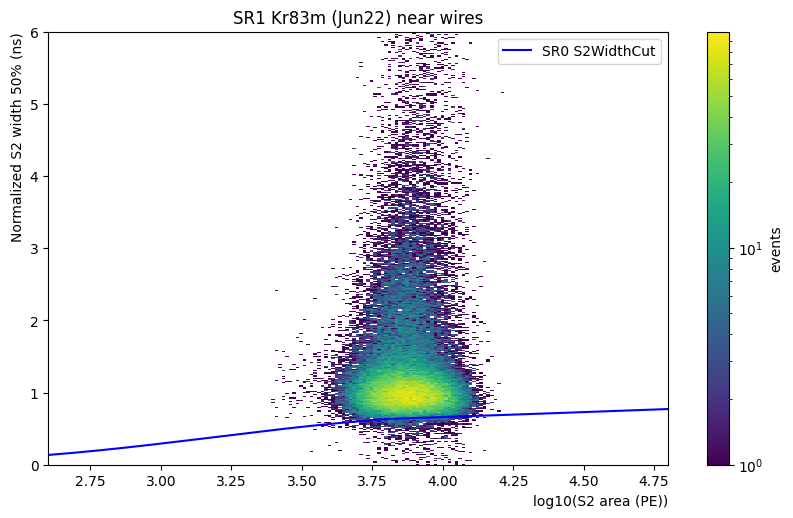

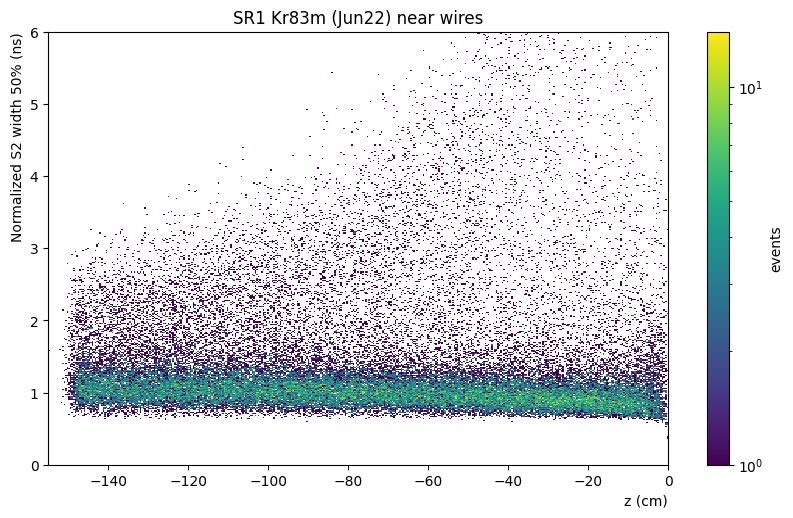

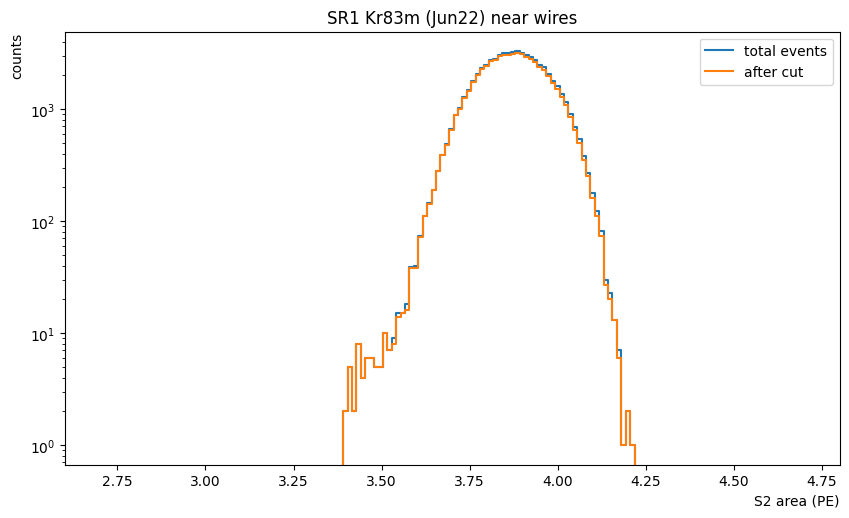

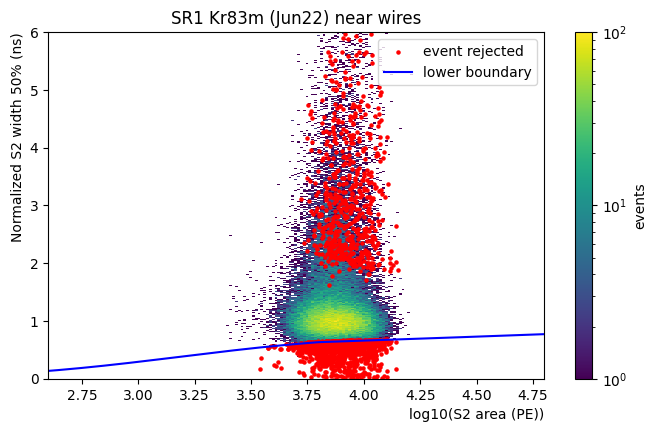

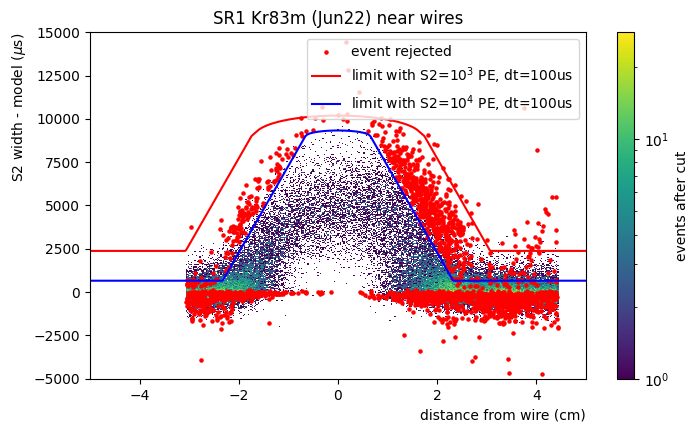

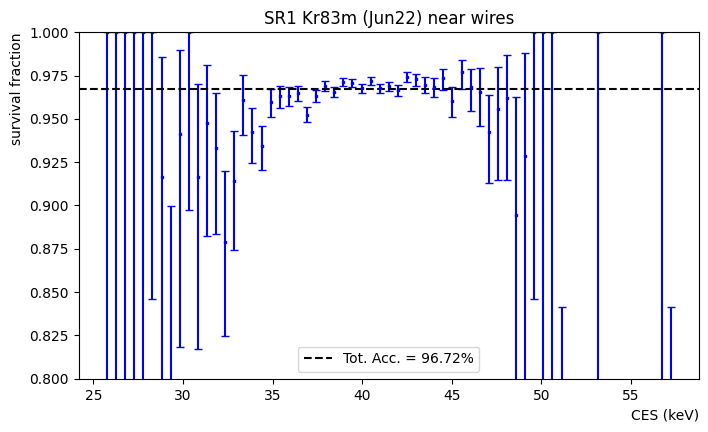

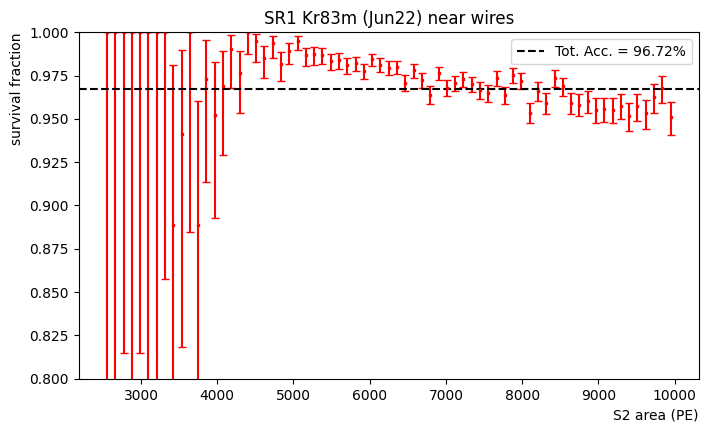

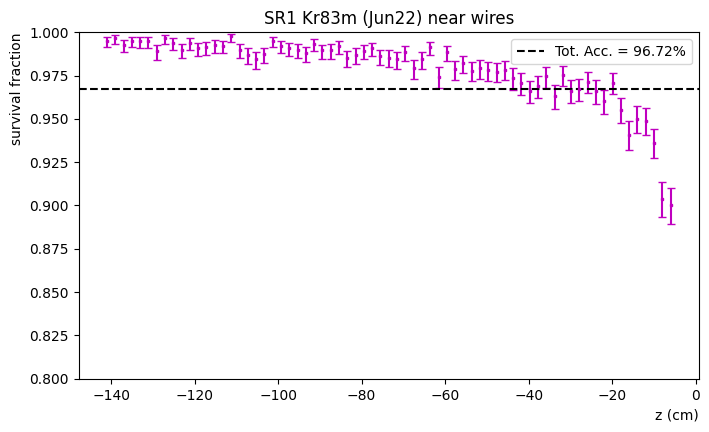

In [129]:
apply_cut(evKr1, title = 'SR1 Kr83m (Jun22) near wires', near = 1,name='sr1_kr83m_jun22_nw')

/home/valerioda/.local/lib/python3.8/site-packages/pandas-1.4.2-py3.8-linux-x86_64.egg/pandas/core/arraylike.py:397: RuntimeWarning: invalid value encountered in sqrt
  result = getattr(ufunc, method)(*inputs, **kwargs)


Lower and higher boundary provided externally
param_parabola_low: [0.00487747 0.09634786 0.19632401]
param_parabola_high: [ 0.12086553 -1.2295208   4.37596581]
Cut: total 772395, survived 742390 -> 96.12%


/home/valerioda/xenon-notes/fast_response_analysis/s2widthcut_utility.py:764: RuntimeWarning: invalid value encountered in long_scalars
  avg = k / n
/home/valerioda/xenon-notes/fast_response_analysis/s2widthcut_utility.py:764: RuntimeWarning: invalid value encountered in long_scalars
  avg = k / n
/home/valerioda/xenon-notes/fast_response_analysis/s2widthcut_utility.py:764: RuntimeWarning: invalid value encountered in long_scalars
  avg = k / n
/home/valerioda/xenon-notes/fast_response_analysis/s2widthcut_utility.py:764: RuntimeWarning: invalid value encountered in long_scalars
  avg = k / n
/home/valerioda/.local/lib/python3.8/site-packages/multihist-0.6.5-py3.8.egg/multihist.py:106: RuntimeWarning: invalid value encountered in true_divide
  getattr(self.histogram, opname)(other),


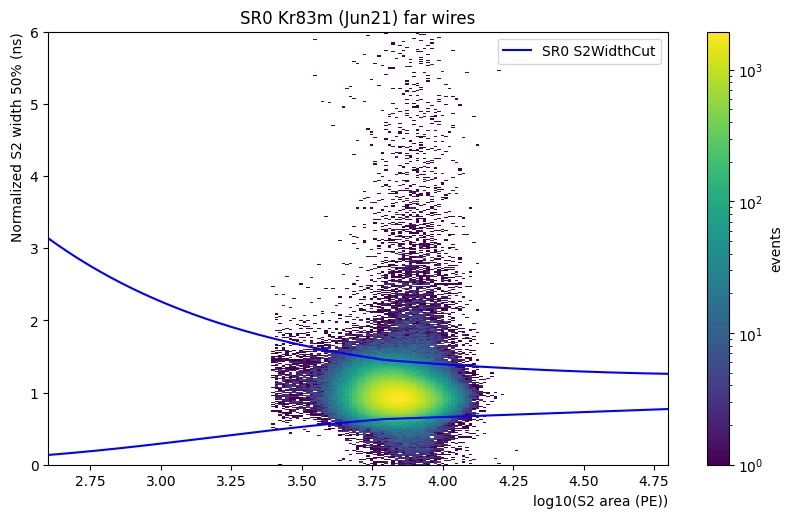

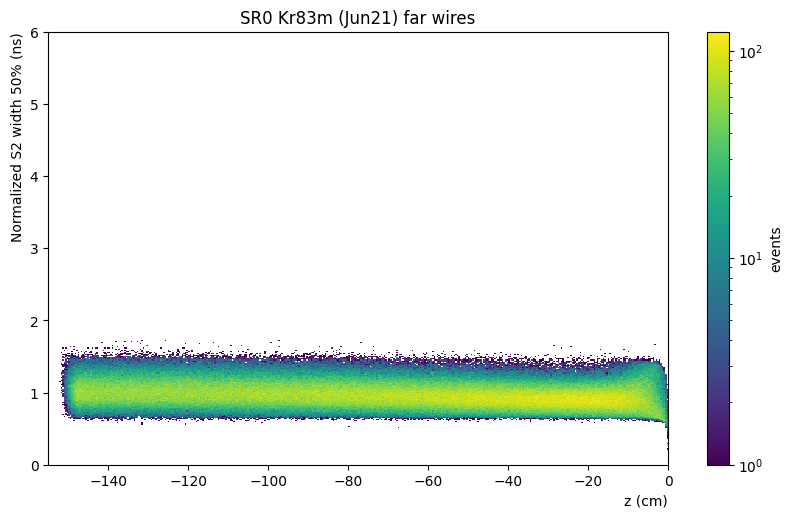

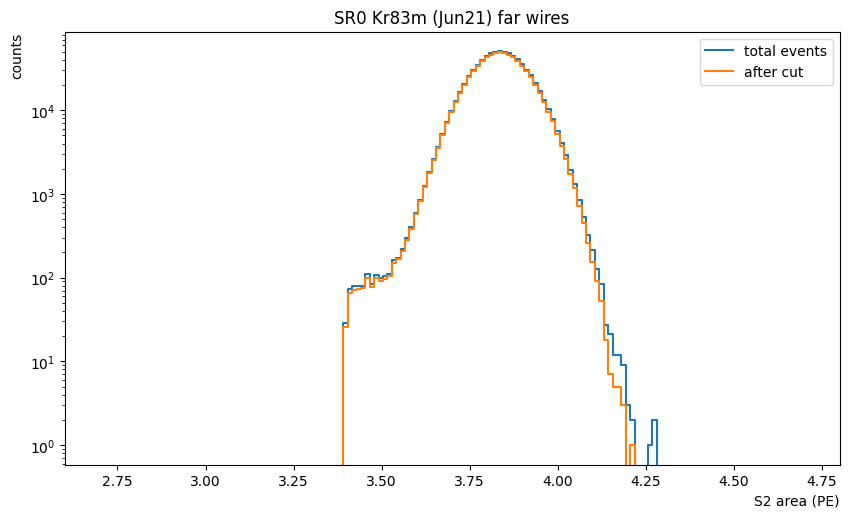

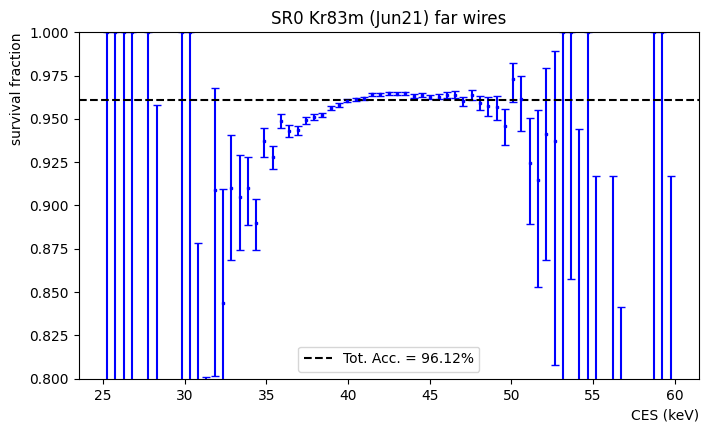

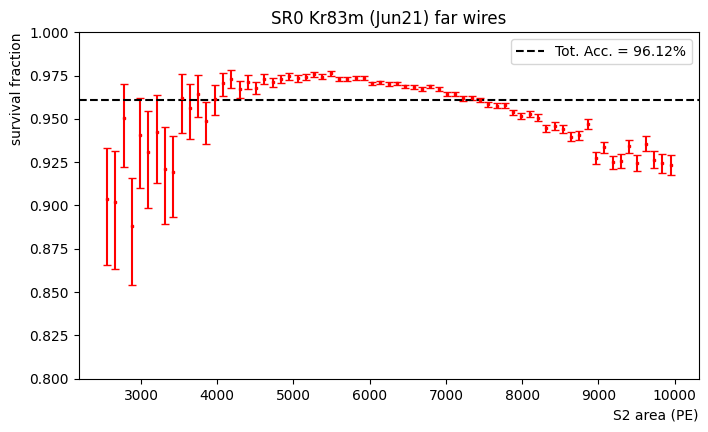

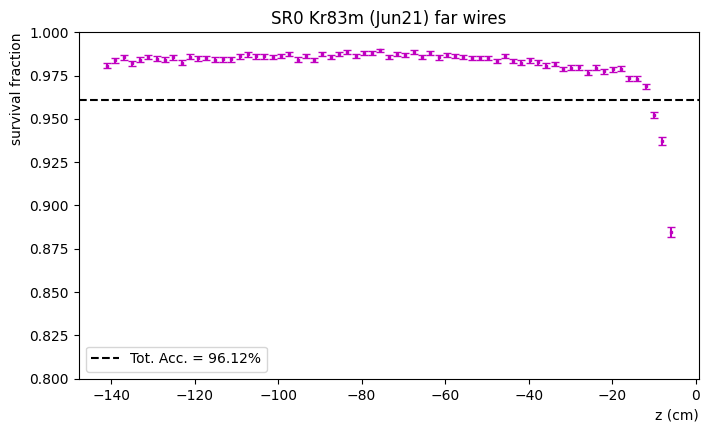

In [133]:
apply_cut(evKr_sr0, title = 'SR0 Kr83m (Jun21) far wires', near = 0,name='sr0_kr83m_jun21_fw',sr0=1)

/home/valerioda/.local/lib/python3.8/site-packages/pandas-1.4.2-py3.8-linux-x86_64.egg/pandas/core/arraylike.py:397: RuntimeWarning: invalid value encountered in sqrt
  result = getattr(ufunc, method)(*inputs, **kwargs)


Lower and higher boundary provided externally
param_parabola_low: [0.00487747 0.09634786 0.19632401]
param_parabola_high: [ 0.12086553 -1.2295208   4.37596581]
Cut: total 109355, survived 106847 -> 97.71%
Cut wire modeled: total 109355, survived 106139 -> 97.06%


/home/valerioda/xenon-notes/fast_response_analysis/s2widthcut_utility.py:764: RuntimeWarning: invalid value encountered in long_scalars
  avg = k / n
/home/valerioda/xenon-notes/fast_response_analysis/s2widthcut_utility.py:764: RuntimeWarning: invalid value encountered in long_scalars
  avg = k / n
/home/valerioda/xenon-notes/fast_response_analysis/s2widthcut_utility.py:764: RuntimeWarning: invalid value encountered in long_scalars
  avg = k / n
/home/valerioda/.local/lib/python3.8/site-packages/multihist-0.6.5-py3.8.egg/multihist.py:106: RuntimeWarning: invalid value encountered in true_divide
  getattr(self.histogram, opname)(other),


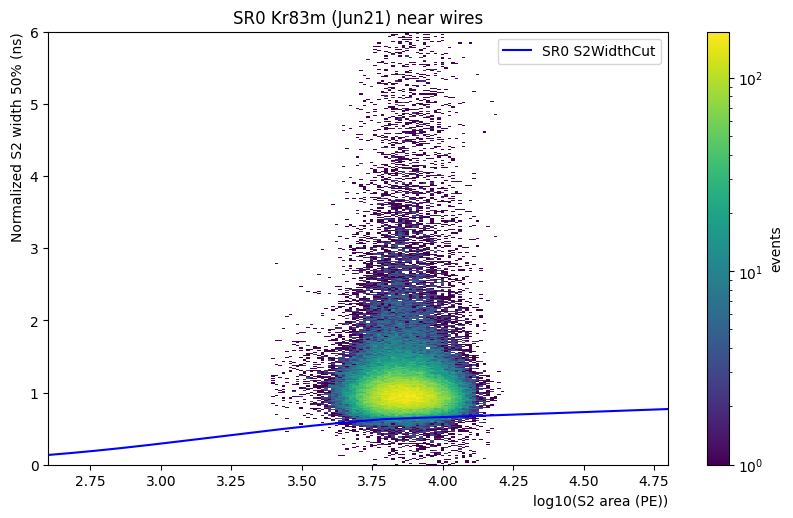

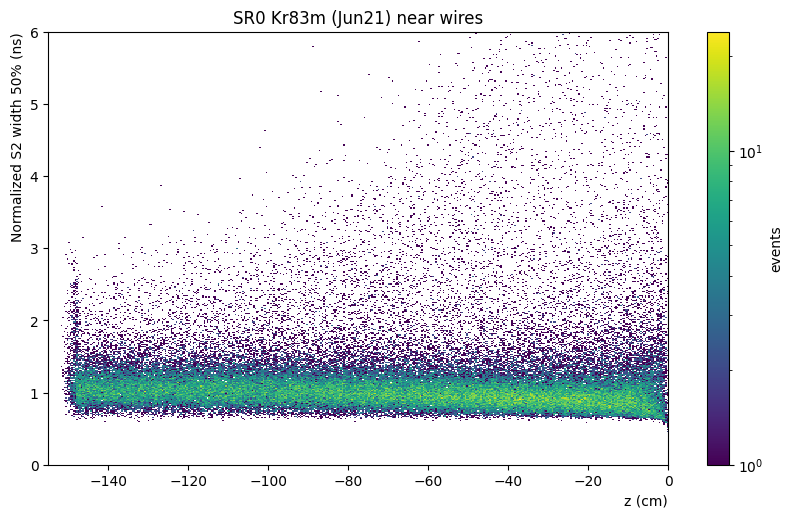

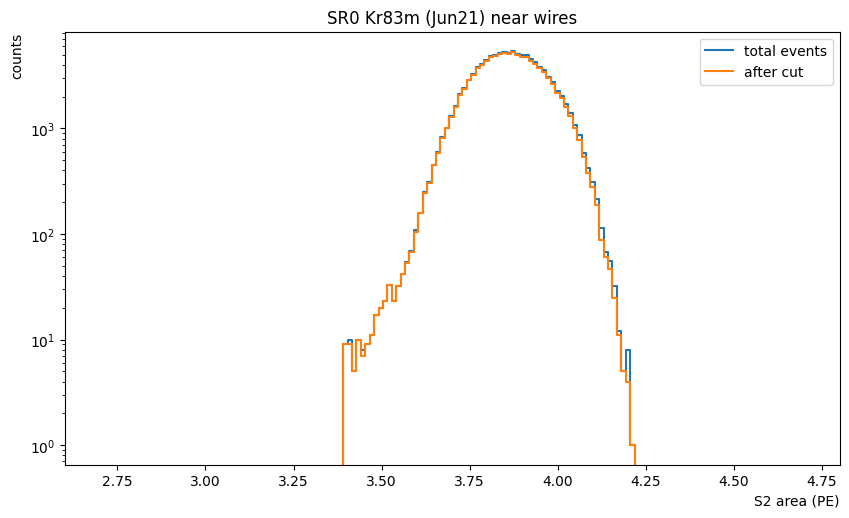

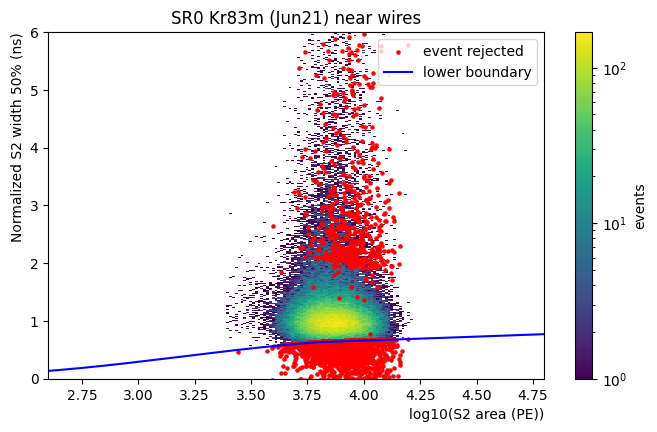

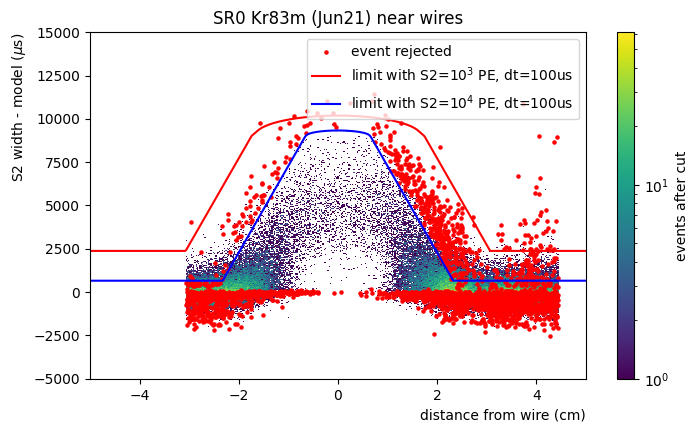

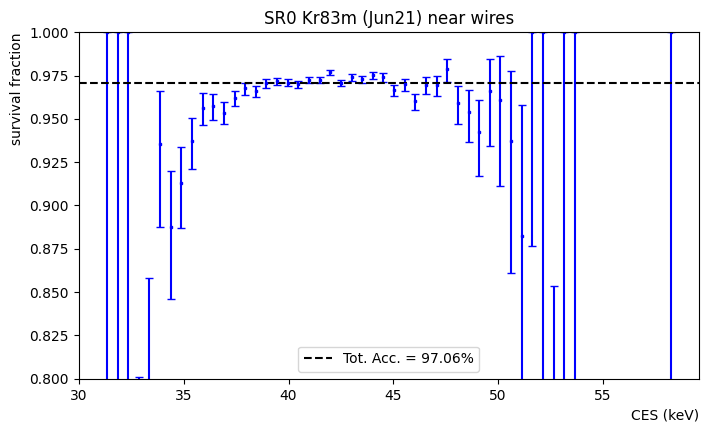

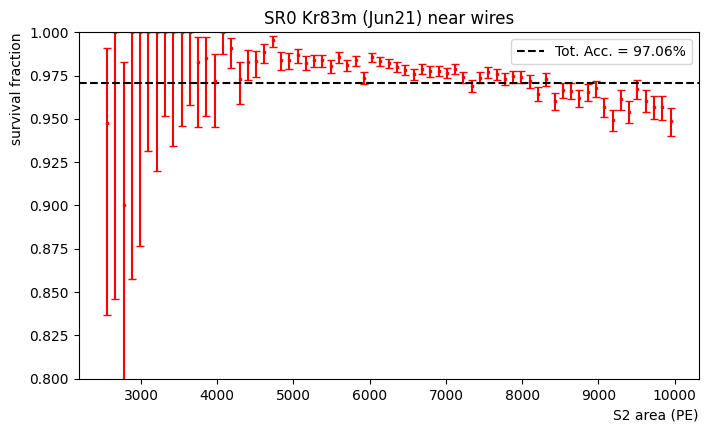

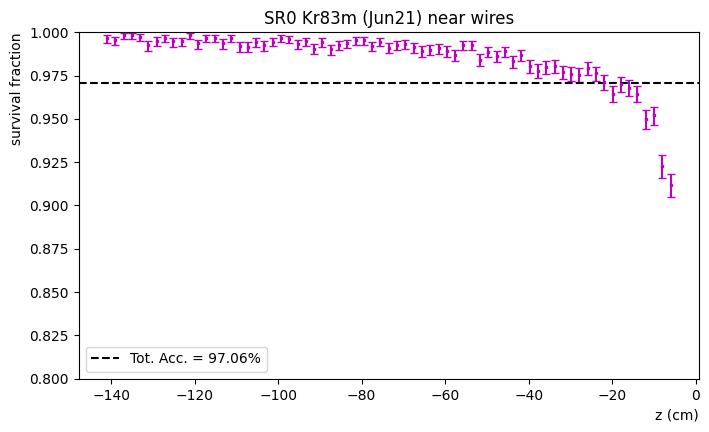

In [134]:
apply_cut(evKr_sr0, title = 'SR0 Kr83m (Jun21) near wires', near = 1,name='sr0_kr83m_jun21_nw',sr0=1)

# BACKGROUND STUDY

In [7]:
dsets = st.select_runs(run_mode='background_linked',available='event_info',
                       exclude_tags=('bad','messy','hot_spot','ramp_up'))

In [8]:
dsets0 = dsets[(dsets.end > pd.to_datetime('07/25/2022')) & (dsets.end < pd.to_datetime('08/07/2022'))]
dsets1 = dsets[(dsets.end > pd.to_datetime('05/01/2022')) & (dsets.end < pd.to_datetime('07/01/2022'))]

In [9]:
bkg_runs0 = dsets0.name.values[:]
bkg_runs1 = dsets1.name.values[:]
print(len(bkg_runs0), len(bkg_runs1))

101 780


In [10]:
ddir = '/dali/lgrandi/dandrea/data'
#evbkg0 = ddu.merge_runs(st,bkg_runs0[:])
#evbkg0.to_pickle(f'{ddir}/SR0_bkg_{bkg_runs0[0]}_{bkg_runs0[-1]}_EventInfo.pkl')
evbkg0 = pd.read_pickle(f'{ddir}/SR0_bkg_{bkg_runs0[0]}_{bkg_runs0[-1]}_EventInfo.pkl')

In [12]:
#evbkg1 = ddu.merge_runs(st,bkg_runs1[:500])
#evbkg1.to_pickle(f'{ddir}/SR0_bkg_{bkg_runs1[0]}_{bkg_runs1[500]}_EventInfo.pkl')
evbkg1 = pd.read_pickle(f'{ddir}/SR0_bkg_{bkg_runs1[0]}_{bkg_runs1[500]}_EventInfo.pkl')

/home/valerioda/.local/lib/python3.8/site-packages/pandas-1.4.2-py3.8-linux-x86_64.egg/pandas/core/arraylike.py:397: RuntimeWarning: invalid value encountered in sqrt
  result = getattr(ufunc, method)(*inputs, **kwargs)


total events 369821
Lower and higher boundary provided externally
param_parabola_low: [0.00487747 0.09634786 0.19632401]
param_parabola_high: [ 0.12086553 -1.2295208   4.37596581]
Cut: total 369821, survived 247819 -> 67.01%


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


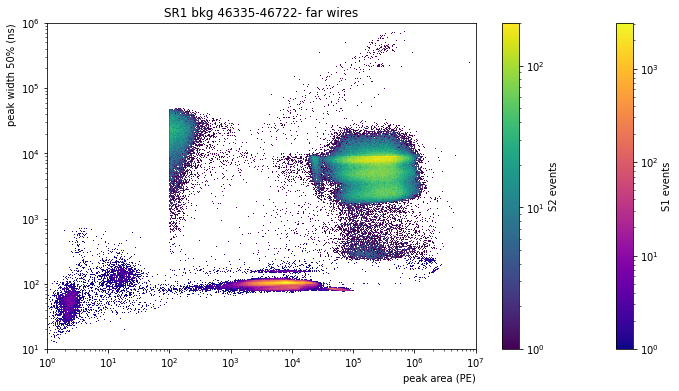

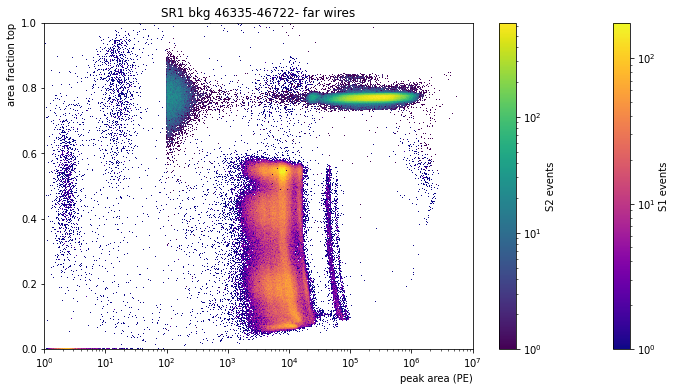

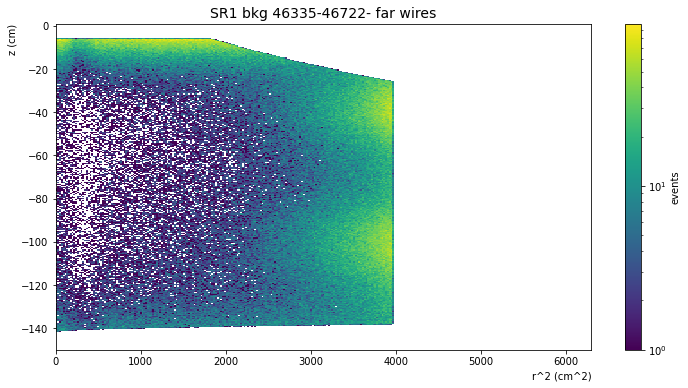

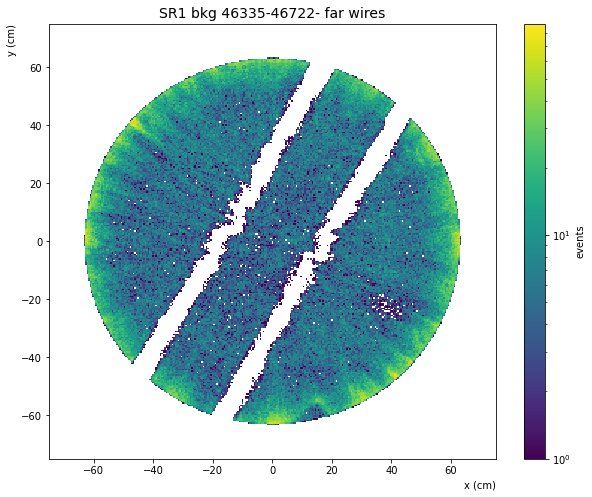

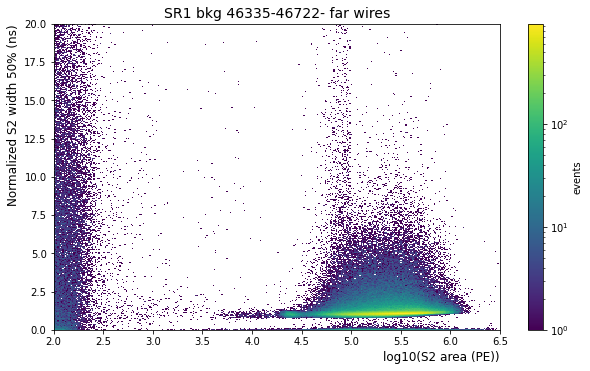

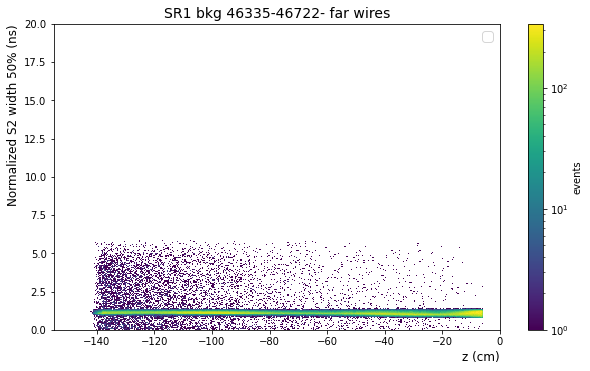

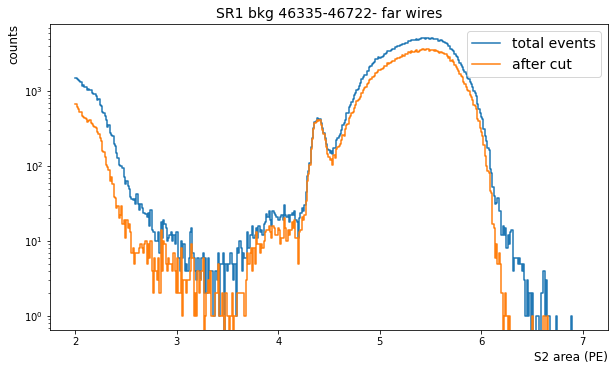

In [22]:
fit_par = (( 0.75785949,3.18263529,1.26349891), ( 4.74467848,1.34106577,1.99650474,1.02559667 ))
maskFW, maskNW = wcu.mask_S2Width_vs_pos(evbkg0)
#maskFV = ddu.mask_FV(evbkg0)
FiducialVolume = st.get_single_plugin('030000', 'cut_fiducial_volume')
maskFV = FiducialVolume.cut_by(evbkg0)
evv0 = evbkg0[maskFW & maskFV]
title='SR1 bkg 46335-46722 far wires'
ddu.plot_area_width_aft(evv0, title)
wcu.plot_r2z_xy(evv0,title)
cut_ = wcu.S2WidthCut(evv0, title=title, mod_par=par, bins=400,ext_par=fit_par,
                      wrange=(0,20), arange = (2.,6.5), plot = 1, perc_plot=0)

/home/valerioda/.local/lib/python3.8/site-packages/pandas-1.4.2-py3.8-linux-x86_64.egg/pandas/core/arraylike.py:397: RuntimeWarning: invalid value encountered in sqrt
  result = getattr(ufunc, method)(*inputs, **kwargs)


total events 338926
Lower and higher boundary provided externally
param_parabola_low: [0.00487747 0.09634786 0.19632401]
param_parabola_high: [ 0.12086553 -1.2295208   4.37596581]
Cut: total 338926, survived 239575 -> 70.69%


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


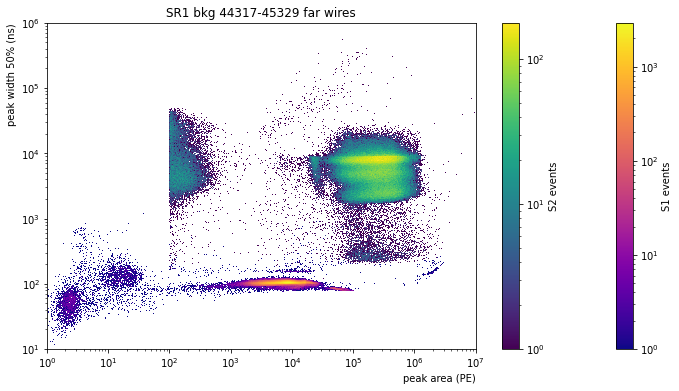

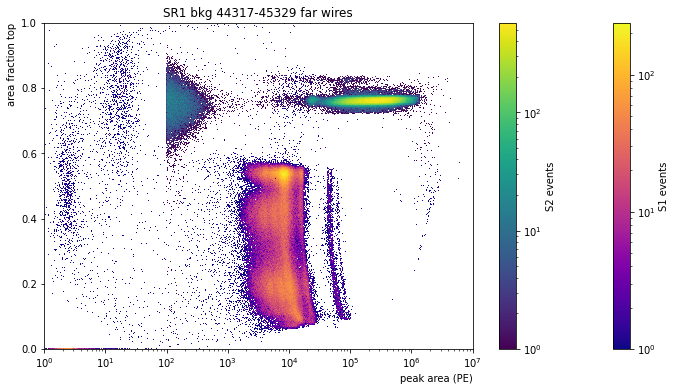

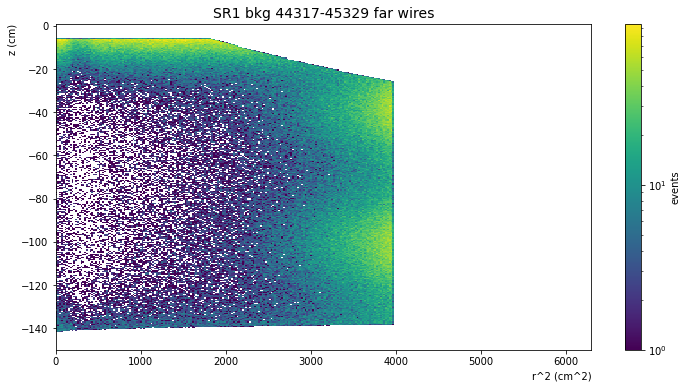

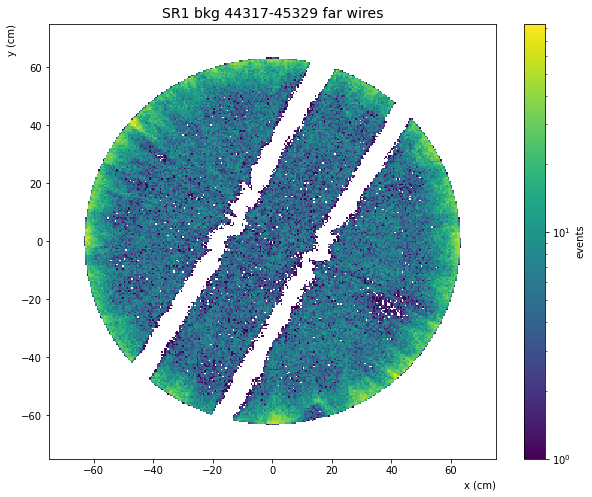

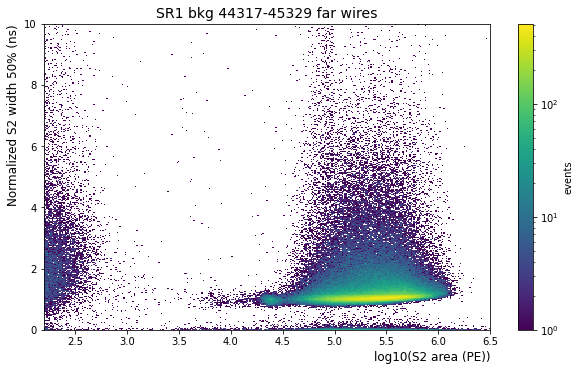

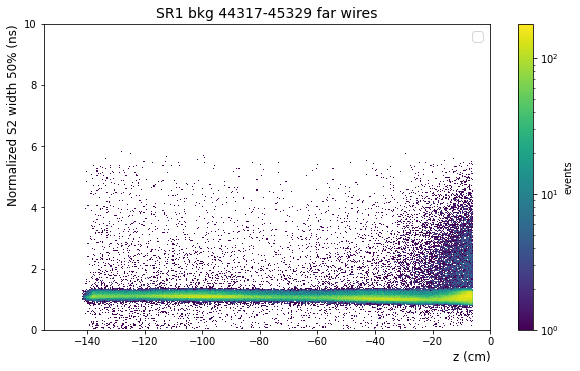

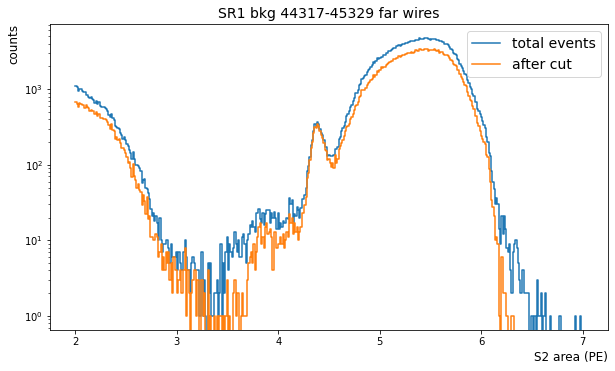

In [20]:
maskFW, maskNW = wcu.mask_S2Width_vs_pos(evbkg1)
maskFV = FiducialVolume.cut_by(evbkg1)
evv1 = evbkg1[maskFW & maskFV]
title='SR1 bkg 44317-45329 far wires'
ddu.plot_area_width_aft(evv1, title)
wcu.plot_r2z_xy(evv1,title)
cut_ = wcu.S2WidthCut(evv1, title=title, mod_par=par, bins=400,ext_par=fit_par,
                      wrange=(0,10), arange = (2.2,6.5), plot = 1, perc_plot=0)

In [36]:
import bokeh.plotting as bklt
from IPython.core.display import display, HTML
def display_events(st,run_id, nev = 1, area_cut=(1e2,1e7)):
    if (st.is_stored(run_id, ('event_info'))==False): return print('No events stored')
    ev0 = st.get_array(run_id,['event_info', 'cut_fiducial_volume'],progress_bar=False)
    maskFW, maskNW = wcu.mask_S2Width_vs_pos(ev0)
    mask = (ev0['s2_area'] > area_cut[0]) & (ev0['s2_area'] < area_cut[1])
    ev = ev0[maskFW & ev0['cut_fiducial_volume']]
    events = ev0[mask & maskFW & ev0['cut_fiducial_volume']]
    print('total events',len(ev0),'\nafter FV & far wires',len(ev),'\nafter area selection',len(events))
    for i in range(nev):
        idx = int(np.random.rand()*len(events))
        fig = st.event_display_interactive(run_id,
                                           time_range=(events[idx]['time'],
                                                       events[idx]['endtime']),
                                           bottom_pmt_array=False)
        bklt.show(fig)

/tmp/jobs/21986510/ipykernel_2671/2738366215.py:2: DeprecationWarning: Importing display from IPython.core.display is deprecated since IPython 7.14, please import from IPython display
  from IPython.core.display import display, HTML


In [39]:
display_events(st,'046722', nev = 10, area_cut=(0,1e3))

total events 60065 
after FV & far wires 8708 
after area selection 784


/opt/XENONnT/anaconda/envs/XENONnT_development/lib/python3.8/site-packages/straxen/analyses/bokeh_waveform_plot.py:562: RuntimeWarning: divide by zero encountered in log10
  area_plot = np.log10(area_per_channel)
